(array([-0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2]),
 [Text(1, -0.2, '−0.2'),
  Text(1, 0.0, '0.0'),
  Text(1, 0.2, '0.2'),
  Text(1, 0.4000000000000001, '0.4'),
  Text(1, 0.6000000000000001, '0.6'),
  Text(1, 0.8, '0.8'),
  Text(1, 1.0000000000000002, '1.0'),
  Text(1, 1.2000000000000002, '1.2')])

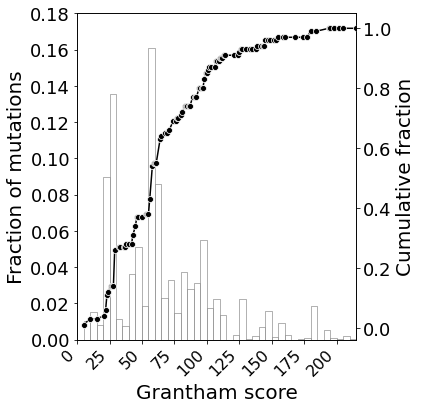

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
fig, ax = plt.subplots()
fig.set_size_inches(5, 6)
ec1=pd.read_csv('lplanta_syno_non_syno_and_grantham_score_without_stop_codons.csv', index_col=0)
ec1

non_syno=ec1[ec1.AA_mutation_effect == 'Non-synonymous']
non_syno
ns_g_c=non_syno[['Query_codon','Cons_codon']].groupby(non_syno['Grantham_dist']).value_counts(normalize=True).reset_index(name='GS_count')
ns_g_c.head()

ns_g_c['sum_GS_count'] = ns_g_c.groupby('Grantham_dist')['GS_count'].transform('sum')
ns_g_c=non_syno['Grantham_dist'].value_counts(normalize=True).reset_index(name='GS_count')
ns_g_c
ns_g_c=ns_g_c.sort_values(by='index')

ns_g_c['cum_GS']=ns_g_c['GS_count'].cumsum()
ns_g_c['GS_count']=ns_g_c['GS_count'].round(2)
ns_g_c['cum_GS']=ns_g_c['cum_GS'].round(2)
g=sns.histplot(data=non_syno, x="Grantham_dist",stat="proportion",binwidth=5, color='white', alpha=0.6,edgecolor="grey")
ax.autoscale(tight=True)

plt.yticks(fontsize=18)
plt.xticks(fontsize=16)
ax.set_ylim(0, 0.18)
ax.set_xlim(0, 215)
plt.xticks(rotation = 45, ha="right") # Rotates X-Axis Ticks by 45-degrees

plt.ylabel('Fraction of mutations',fontsize=20)
plt.xlabel('Grantham score',fontsize=20)

ax1 = plt.twinx()
g1=sns.lineplot(data=ns_g_c, x='index', y='cum_GS', lw=1.5,color='black', markers=True,dashes=False,marker='o')
plt.ylabel('Cumulative fraction',fontsize=20)
plt.yticks(fontsize=18)



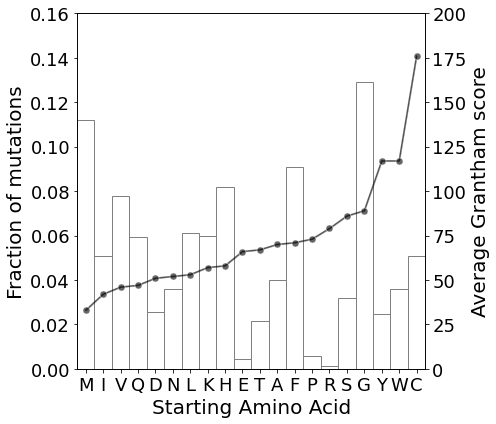

In [1]:
#plot of amino acid mutation fraction (first y axis) and average GS (second y axis) against amino acid
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
ns_a=pd.read_csv('lplanta_aa_sub_non_syno_avg_gs.csv')
#syno amino
s_a=pd.read_csv('lplanta_aa_sub_count_syno.csv')
ns_a=ns_a.set_index('aa_substitution')
s_a=s_a.set_index('aa_substitution')
##all syo and non-syno
ec1=pd.read_csv('lplanta_syno_non_syno_and_grantham_score_without_stop_codons.csv', index_col=0)
ec1
ns_a
fig, ax = plt.subplots()
fig.set_size_inches(7, 6)
#ax1 = plt.subplot()

g=sns.histplot(data=ec1, x="Cons_aa",stat="proportion",binwidth=2, color='white', edgecolor="grey",alpha=0.5)
ax.autoscale(tight=True)

plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
ax.set_ylim(0, 0.16)

plt.ylabel('Fraction of mutations',fontsize=20)
plt.xlabel('Grantham score',fontsize=20)

ax.set(xlabel='Starting Amino Acid', ylabel='Fraction of mutations')

ax1 = plt.twinx()
ns_a=ns_a.sort_values(by='Average_GS')

g1=sns.lineplot(data=ns_a, x='Cons_aa', y='Average_GS', lw=1.5,color='black', alpha=0.6,marker='o',markersize=7,markers=True,dashes=False)
plt.yticks(fontsize=18)
plt.ylabel('Average Grantham score',fontsize=20)
ax1.autoscale(tight=True)
ax1.set_ylim(0, 200)

fig.tight_layout() 
plt.show()


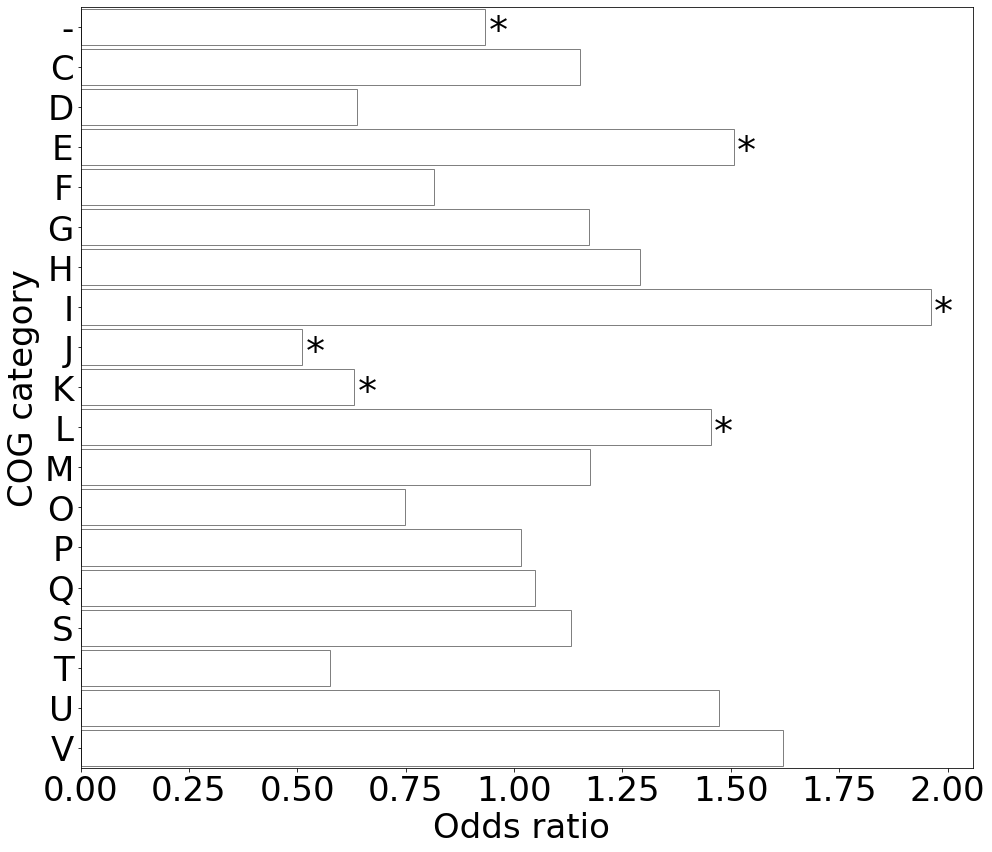

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
#log2 calcultation
import math
import numpy as np
df=pd.read_csv('cog_var_count_and_no_of_genes_with_fisher_exact_results.csv')
df
#log2 calcultation
import math
import numpy as np
#log2 = math.log2(0.9339)   # python 3.3 or later
#log2
####
df['log2odd']=np.log2(df['Odds_ratio'])
df
df1=df[['COG_category','log2odd','Odds_ratio']]

#log2 = math.log2(0.9339)   # python 3.3 or later
#log2
####
#df1['log2odd']=np.log2(df1['Odds_ratio'])
#df
#df1=df[['COG_category','log2odd','Odds_ratio']]
#df1=df1.sort_values(by='Odds_ratio', ascending=False)
fig, ax= plt.subplots(figsize=(16,14))

ax=sns.barplot(data=df1, y="COG_category", x="Odds_ratio",width=0.9,palette=['white'], edgecolor='grey',orient='h')
plt.ylabel('COG category',fontsize=34)
plt.xlabel('Odds ratio ',fontsize=34)
plt.yticks(fontsize=34)
plt.xticks(fontsize=34)


# Categories for which you want to add an asterisk
categories_with_asterisk = ['I','E','L','-','K','J']
# Add asterisks for specific categories
for i, bar in enumerate(ax.patches):
    if df1['COG_category'][i] in categories_with_asterisk:
        ax.text(bar.get_width()+0.03 ,
                bar.get_y() + bar.get_height()/2 +0.6,
                '*',
                fontsize=38,
                ha='center',va='bottom',
                color='black')

plt.show()


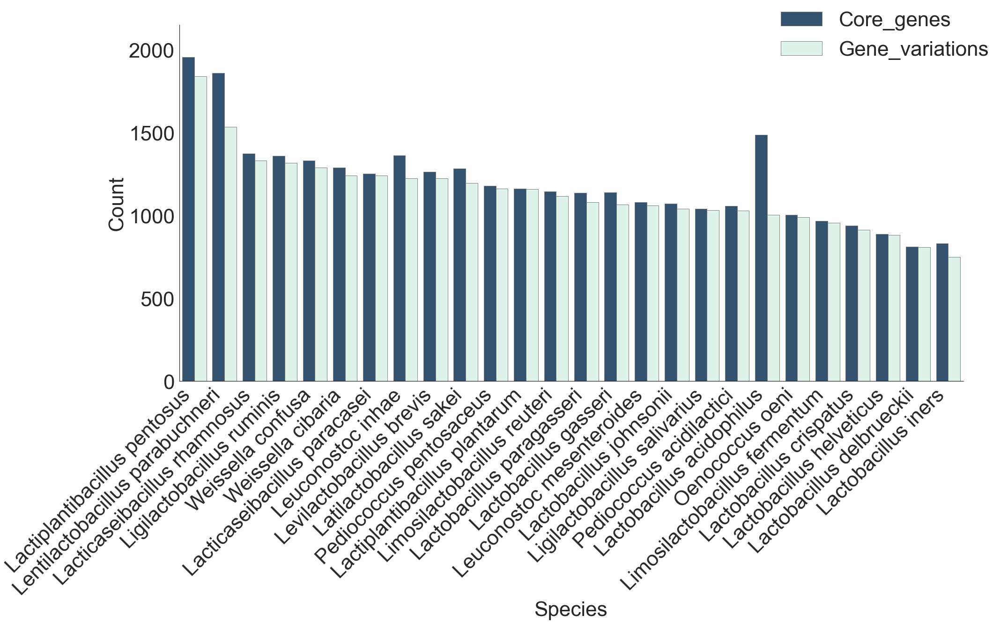

In [6]:
c4=pd.read_csv('lacto_all_core_genes_and_variant_genes_num_alleles_before_and_after_processing_with_species.csv', index_col=0)
c4
c4['Species'] = c4['Species'].apply({'Pediococcus_acidilactici':'Pediococcus acidilactici','Lactobacillus_crispatus':'Lactobacillus crispatus','Lactobacillus_delbrueckii':'Lactobacillus delbrueckii','Lactobacillus_johnsonii':'Lactobacillus johnsonii','Lactobacillus_helveticus':'Lactobacillus helveticus','Lactobacillus_paragasseri':'Lactobacillus paragasseri','Pediococcus_pentosaceus':'Pediococcus pentosaceus','Lactobacillus_iners':'Lactobacillus iners','Lactobacillus_gasseri':'Lactobacillus gasseri','Lactobacillus_acidophilus':'Lactobacillus acidophilus','Weissella_confusa':'Weissella confusa','Weissella_cibaria':'Weissella cibaria','Lactiplantibacillus_plantarum':'Lactiplantibacillus plantarum','Lactiplantibacillus_pentosus':'Lactiplantibacillus pentosus','Ligilactobacillus_salivarius':'Ligilactobacillus salivarius','Ligilactobacillus_ruminis':'Ligilactobacillus ruminis','Leuconostoc_mesenteroides':'Leuconostoc mesenteroides','Leuconostoc_inhae':'Leuconostoc inhae','Lacticaseibacillus_paracasei':'Lacticaseibacillus paracasei','Lacticaseibacillus_rhamnosus':'Lacticaseibacillus rhamnosus','Oenococcus_oeni':'Oenococcus oeni','Latilactobacillus_sakei':'Latilactobacillus sakei','Lentilactobacillus_parabuchneri':'Lentilactobacillus parabuchneri','Limosilactobacillus_fermentum':'Limosilactobacillus fermentum','Limosilactobacillus_reuteri':'Limosilactobacillus reuteri','Levilactobacillus_brevis':'Levilactobacillus brevis'}.get)
c4=c4.sort_values(by='Gene_variations', ascending=False)

df1 = c4.melt(id_vars=['Species'], value_vars=['Core_genes', 'Gene_variations', ],var_name='Genes_alleles',value_name='Count')
df2 = c4.melt(id_vars=['Species'], value_vars=['Num_Alleles', 'Num_alleles_after'],var_name='Num_alleles',value_name='Count')
fig, ax= plt.subplots(figsize=(30,14))

import seaborn as sns
ax1=sns.barplot(data=df1, x="Species", y="Count", hue="Genes_alleles",width=0.8,palette=['#28527A','#DBF6E9'],edgecolor='gray')
#ax2=sns.barplot(data=df2, x="Species", y="Count", hue="Num_alleles",width=0.9,palette=['red','yellow'])
ax.tick_params(axis='x', labelsize=44)
ax.tick_params(axis='y', labelsize=44)

ax.margins(y=0.1)
plt.xticks(rotation = 45, ha="right") # Rotates X-Axis Ticks by 45-degrees
sns.despine()
#for i in ax.containers:
#    ax.bar_label(i,padding=4,fontsize=24, rotation=90)

plt.xlabel('Species',fontsize=44)
plt.ylabel('Count',fontsize=44)
sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(0.90, 0.85), ncol=1, title=None,fontsize="44", frameon=False)



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


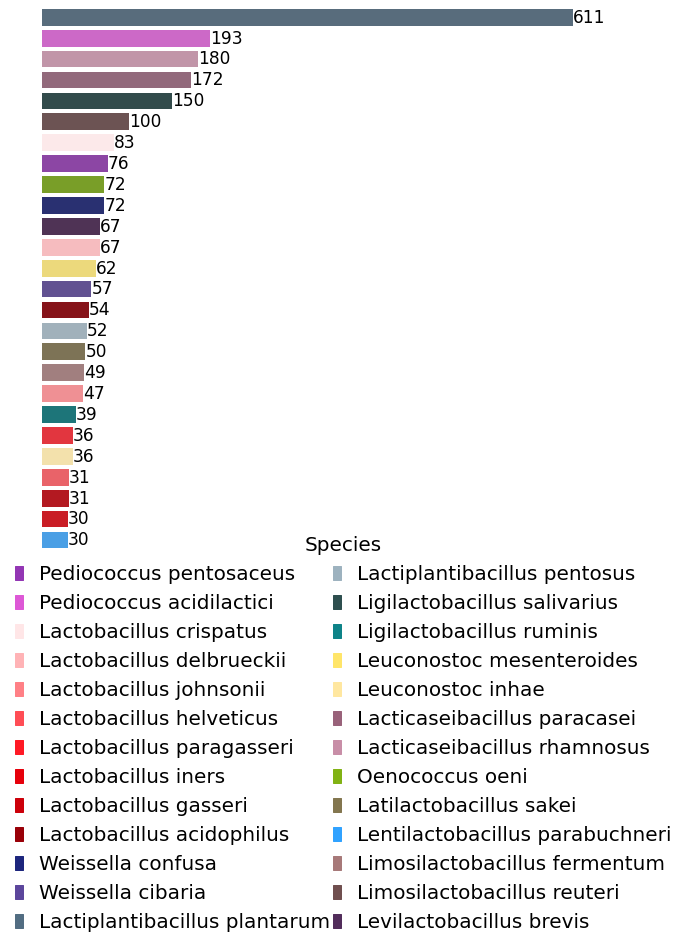

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import matplotlib.patches as mpatches

c3=pd.read_csv('lacto_all_sp_with_strain_and_strains_having_variants.csv')
c3.head()
c3['Species'] = c3['Species'].apply({'Pediococcus_acidilactici':'Pediococcus acidilactici','Lactobacillus_crispatus':'Lactobacillus crispatus','Lactobacillus_delbrueckii':'Lactobacillus delbrueckii','Lactobacillus_johnsonii':'Lactobacillus johnsonii','Lactobacillus_helveticus':'Lactobacillus helveticus','Lactobacillus_paragasseri':'Lactobacillus paragasseri','Pediococcus_pentosaceus':'Pediococcus pentosaceus','Lactobacillus_iners':'Lactobacillus iners','Lactobacillus_gasseri':'Lactobacillus gasseri','Lactobacillus_acidophilus':'Lactobacillus acidophilus','Weissella_confusa':'Weissella confusa','Weissella_cibaria':'Weissella cibaria','Lactiplantibacillus_plantarum':'Lactiplantibacillus plantarum','Lactiplantibacillus_pentosus':'Lactiplantibacillus pentosus','Ligilactobacillus_salivarius':'Ligilactobacillus salivarius','Ligilactobacillus_ruminis':'Ligilactobacillus ruminis','Leuconostoc_mesenteroides':'Leuconostoc mesenteroides','Leuconostoc_inhae':'Leuconostoc inhae','Lacticaseibacillus_paracasei':'Lacticaseibacillus paracasei','Lacticaseibacillus_rhamnosus':'Lacticaseibacillus rhamnosus','Oenococcus_oeni':'Oenococcus oeni','Latilactobacillus_sakei':'Latilactobacillus sakei','Lentilactobacillus_parabuchneri':'Lentilactobacillus parabuchneri','Limosilactobacillus_fermentum':'Limosilactobacillus fermentum','Limosilactobacillus_reuteri':'Limosilactobacillus reuteri','Levilactobacillus_brevis':'Levilactobacillus brevis'}.get)

c3=c3.sort_values(by=['Num_strains_with_var'],ascending=False)
col_dict={'Pediococcus pentosaceus':'#9336B4', 'Pediococcus acidilactici':'#DD58D6','Lactobacillus crispatus':'#FFE6E7','Lactobacillus delbrueckii':'#FFB3B6','Lactobacillus johnsonii':'#FF8086','Lactobacillus helveticus':'#FF4D55',
    'Lactobacillus paragasseri':'#FF1925','Lactobacillus iners':'#E6000B','Lactobacillus gasseri':'#CC000A','Lactobacillus acidophilus':'#990008','Weissella confusa':'#1D267D','Weissella cibaria':'#5C469C',
    'Lactiplantibacillus plantarum':'#526D82','Lactiplantibacillus pentosus':'#9DB2BF','Ligilactobacillus salivarius':'#2E4F4F','Ligilactobacillus ruminis':'#0E8388',
    'Leuconostoc mesenteroides':'#FFE569','Leuconostoc inhae':'#FFE7A0','Lacticaseibacillus paracasei':'#99627A','Lacticaseibacillus rhamnosus':'#C88EA7',
    'Oenococcus oeni':'#81B214','Latilactobacillus sakei':'#83764F','Lentilactobacillus parabuchneri':'#30A2FF',
    'Limosilactobacillus fermentum':'#A77979','Limosilactobacillus reuteri':'#704F4F','Levilactobacillus brevis':'#522D5B'}

fig, ax= plt.subplots(figsize=(10,10))

ax=sns.barplot(data=c3, x="Num_strains_with_var", y="Species", palette=col_dict)
#plt.legend(title='Species',title_fontsize=30, bbox_to_anchor=(1.15,0.6), ncol=2,columnspacing=0.3,loc='upper left',fontsize=32, frameon=False)
ax.legend(markerscale=4)

for i in ax.containers:
    ax.bar_label(i,fontsize=17)

# Creating custom patches for the legend
plt.axis('off')

patches = [mpatches.Patch(color=v, label=k) for k, v in col_dict.items()]
plt.legend(handles=patches, handlelength=0.4,title='Species',title_fontsize=20,bbox_to_anchor=(-0.08,0.06), ncol=2,columnspacing=0.15,loc='upper left',fontsize=20, frameon=False)

plt.show()



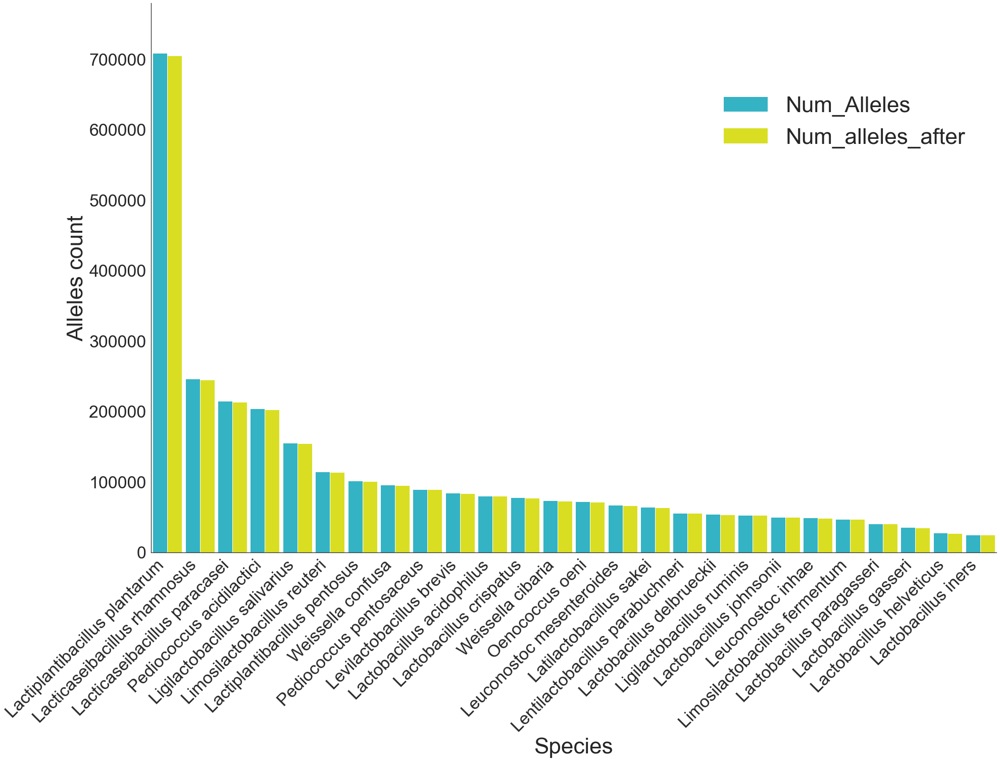

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
c4=pd.read_csv('lacto_all_core_genes_and_variant_genes_num_alleles_before_and_after_processing_with_species.csv', index_col=0)
c4['Species'] = c4['Species'].apply({'Pediococcus_acidilactici':'Pediococcus acidilactici','Lactobacillus_crispatus':'Lactobacillus crispatus','Lactobacillus_delbrueckii':'Lactobacillus delbrueckii','Lactobacillus_johnsonii':'Lactobacillus johnsonii','Lactobacillus_helveticus':'Lactobacillus helveticus','Lactobacillus_paragasseri':'Lactobacillus paragasseri','Pediococcus_pentosaceus':'Pediococcus pentosaceus','Lactobacillus_iners':'Lactobacillus iners','Lactobacillus_gasseri':'Lactobacillus gasseri','Lactobacillus_acidophilus':'Lactobacillus acidophilus','Weissella_confusa':'Weissella confusa','Weissella_cibaria':'Weissella cibaria','Lactiplantibacillus_plantarum':'Lactiplantibacillus plantarum','Lactiplantibacillus_pentosus':'Lactiplantibacillus pentosus','Ligilactobacillus_salivarius':'Ligilactobacillus salivarius','Ligilactobacillus_ruminis':'Ligilactobacillus ruminis','Leuconostoc_mesenteroides':'Leuconostoc mesenteroides','Leuconostoc_inhae':'Leuconostoc inhae','Lacticaseibacillus_paracasei':'Lacticaseibacillus paracasei','Lacticaseibacillus_rhamnosus':'Lacticaseibacillus rhamnosus','Oenococcus_oeni':'Oenococcus oeni','Latilactobacillus_sakei':'Latilactobacillus sakei','Lentilactobacillus_parabuchneri':'Lentilactobacillus parabuchneri','Limosilactobacillus_fermentum':'Limosilactobacillus fermentum','Limosilactobacillus_reuteri':'Limosilactobacillus reuteri','Levilactobacillus_brevis':'Levilactobacillus brevis'}.get)
c4=c4.sort_values(by='Num_Alleles', ascending=False)
df2 = c4.melt(id_vars=['Species'], value_vars=['Num_Alleles', 'Num_alleles_after'],var_name='Num_alleles',value_name='Count')
df2.to_csv('data_num_alleles.csv')
fig, ax= plt.subplots(figsize=(30,20))

ax2=sns.barplot(data=df2, x="Species", y="Count", hue="Num_alleles",width=0.9,palette=['#1CC5DC','#F7FD04'])
ax.tick_params(axis='x', labelsize=34)
ax.tick_params(axis='y', labelsize=34)

ax.margins(y=0.1)
plt.xticks(rotation = 45, ha="right") # Rotates X-Axis Ticks by 45-degrees
sns.despine()

plt.xlabel('Species',fontsize=44)
plt.ylabel('Alleles count',fontsize=44)
sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(0.82, 0.70), ncol=1, title=None,fontsize="44", frameon=False)
#for i in ax.containers:
#    ax.bar_label(i,padding=4,fontsize=24, rotation=90)


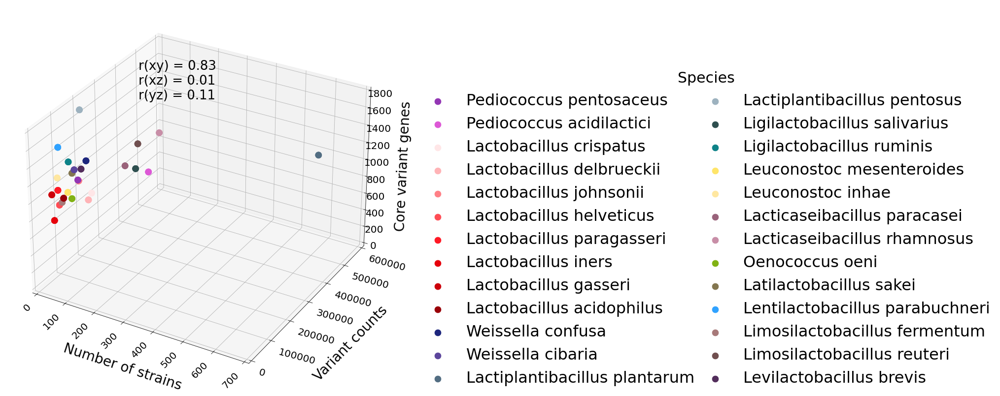

In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from scipy.stats import pearsonr
#3D correlation plot
import pandas as pd
import numpy as np
c4=pd.read_csv('lacto_all_core_genes_and_variant_genes_num_alleles_before_and_after_processing_with_species.csv', index_col=0)
c4
c=pd.read_csv('lacto_all_sp_with_strain_and_strains_having_variants.csv')
c
#d3 = pd.merge(c4, c['Num_strains_with_var'], left_on='Species', how='right')
d=pd.merge(c4, c, on="Species", how="left")
d
d['Species'] = d['Species'].apply({'Pediococcus_acidilactici':'Pediococcus acidilactici','Lactobacillus_crispatus':'Lactobacillus crispatus','Lactobacillus_delbrueckii':'Lactobacillus delbrueckii','Lactobacillus_johnsonii':'Lactobacillus johnsonii','Lactobacillus_helveticus':'Lactobacillus helveticus','Lactobacillus_paragasseri':'Lactobacillus paragasseri','Pediococcus_pentosaceus':'Pediococcus pentosaceus','Lactobacillus_iners':'Lactobacillus iners','Lactobacillus_gasseri':'Lactobacillus gasseri','Lactobacillus_acidophilus':'Lactobacillus acidophilus','Weissella_confusa':'Weissella confusa','Weissella_cibaria':'Weissella cibaria','Lactiplantibacillus_plantarum':'Lactiplantibacillus plantarum','Lactiplantibacillus_pentosus':'Lactiplantibacillus pentosus','Ligilactobacillus_salivarius':'Ligilactobacillus salivarius','Ligilactobacillus_ruminis':'Ligilactobacillus ruminis','Leuconostoc_mesenteroides':'Leuconostoc mesenteroides','Leuconostoc_inhae':'Leuconostoc inhae','Lacticaseibacillus_paracasei':'Lacticaseibacillus paracasei','Lacticaseibacillus_rhamnosus':'Lacticaseibacillus rhamnosus','Oenococcus_oeni':'Oenococcus oeni','Latilactobacillus_sakei':'Latilactobacillus sakei','Lentilactobacillus_parabuchneri':'Lentilactobacillus parabuchneri','Limosilactobacillus_fermentum':'Limosilactobacillus fermentum','Limosilactobacillus_reuteri':'Limosilactobacillus reuteri','Levilactobacillus_brevis':'Levilactobacillus brevis'}.get)

d1=pd.read_csv('lacto_all_26_species_multation_counts_and_total_count.csv')
d1=d1.drop_duplicates()
d1
d2=d1[['Species','Total_count']]
d2
d3=pd.merge(d, d2, on="Species", how="left")
d3
d4=d3[['Species','Gene_variations','Num_strains_with_var','Total_count']]
d4
# Sample data
# Sample data
z = d4['Gene_variations']
x = d4['Num_strains_with_var']
y = d4['Total_count']
categories = d4['Species']# Example categorical values

# Define a dictionary to map categories to colors
col_dict={'Pediococcus pentosaceus':'#9336B4', 'Pediococcus acidilactici':'#DD58D6','Lactobacillus crispatus':'#FFE6E7','Lactobacillus delbrueckii':'#FFB3B6','Lactobacillus johnsonii':'#FF8086','Lactobacillus helveticus':'#FF4D55',
    'Lactobacillus paragasseri':'#FF1925','Lactobacillus iners':'#E6000B','Lactobacillus gasseri':'#CC000A','Lactobacillus acidophilus':'#990008','Weissella confusa':'#1D267D','Weissella cibaria':'#5C469C',
    'Lactiplantibacillus plantarum':'#526D82','Lactiplantibacillus pentosus':'#9DB2BF','Ligilactobacillus salivarius':'#2E4F4F','Ligilactobacillus ruminis':'#0E8388',
    'Leuconostoc mesenteroides':'#FFE569','Leuconostoc inhae':'#FFE7A0','Lacticaseibacillus paracasei':'#99627A','Lacticaseibacillus rhamnosus':'#C88EA7',
    'Oenococcus oeni':'#81B214','Latilactobacillus sakei':'#83764F','Lentilactobacillus parabuchneri':'#30A2FF',
    'Limosilactobacillus fermentum':'#A77979','Limosilactobacillus reuteri':'#704F4F','Levilactobacillus brevis':'#522D5B'}
colors = [col_dict[category] for category in categories]

# Compute Pearson's correlation coefficient for pairs of data
corr_xy, _ = pearsonr(x, y)
corr_xz, _ = pearsonr(x, z)
corr_yz, _ = pearsonr(y, z)

# Plot 3D scatter plot
fig = plt.figure(figsize = (14, 18))
ax = fig.add_subplot(projection='3d')
for category, color in col_dict.items():
    mask = categories == category
    ax.scatter(x[mask], y[mask], z[mask], c=color, label=category, s=160)


#ax.legend(title='Species', title_fontsize=18)

ax.legend(title='Species',title_fontsize=30, bbox_to_anchor=(1.05,0.86), ncol=2,columnspacing=0.3,loc='upper left',fontsize=32, frameon=False)

# Add Pearson's correlation as text annotation
corr_text = f"r(xy) = {corr_xy:.2f}\nr(xz) = {corr_xz:.2f}\nr(yz) = {corr_yz:.2f}"
ax.text2D(0.35, 0.75, corr_text, transform=ax.transAxes,fontsize=26)

ax.set_xlabel('\n\n\nNumber of strains',fontsize=28)
ax.set_ylabel('\n\n\n\n\nVariant counts',fontsize=28)
ax.set_zlabel('\n\n\n Core variant genes \n',fontsize=28)

plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=-15, ha='left')

ax.set_xlim(0, 700)
ax.set_ylim(0, 600000)
ax.set_zlim(0, 1800)

# Adjust font sizes for axis tick labels
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.tick_params(axis='z', labelsize=20)

plt.show()


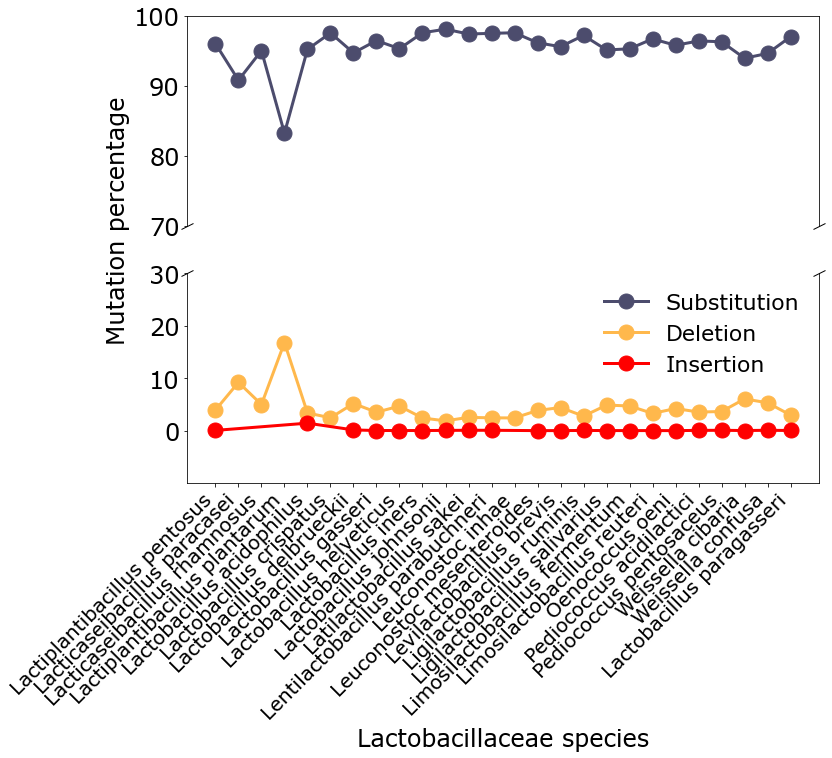

In [3]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
df_1=pd.read_csv('lacto_all_26_species_multation_counts_and_total_count.csv')
#df_1= df.sort_values('Species')

#df_1.head()
plt.rcParams["font.family"] = "Verdana"

df_1['Percentage'] = df_1['Mutation_count'] / df_1['Total_count'] * 100
df_1['Percentage']=df_1['Percentage'].round(3)
#fig, ax = plt.subplots()

df1=df_1[df_1.AA_mutation_type == 'Substitution']
df2=df_1[df_1.AA_mutation_type == 'Deletion']
df3=df_1[df_1.AA_mutation_type == 'Insertion']
values=[0.047,0,0,0,1.427,0,0.132,0.023,0.024,0.016,0.046,0.069,0.066,0,0.003,0.007,0.036,0.016,0.009,0.012,0.001,0.05,0.064,0.019,0.066,0.027]

fig, (ax1, ax2) = plt.subplots(2, 1,  figsize=(12, 11))
fig.subplots_adjust(hspace=0.02)  # adjust space between axes

# Top plot: 60 to 100
ax1.set_ylim(70, 100)
ax1.plot(df1['Species'], df1['Percentage'], color='#4C4C6D', marker='o', markersize=15, linewidth=3, label="Substitution")
ax1.plot(df2['Species'], df2['Percentage'], color='#FFB84C', marker='o', markersize=15, linewidth=3, label="Deletion")
ax1.plot(df3['Species'], df3['Percentage'], color='red', marker='o', markersize=15, linewidth=3, label="Insertion")
#ax1.xaxis.tick_top()
ax1.spines['bottom'].set_visible(False)
#ax1.set_ylabel("Mutation percentage\n",size=22)
ax1.tick_params(labeltop=False)  # don't put tick labels at the top

# Bottom plot: 0 to 30
ax2.set_ylim(-10, 30)
ax2.plot(df1['Species'], df1['Percentage'], color='#4C4C6D', marker='o', markersize=15, linewidth=3, label="Substitution")
ax2.plot(df2['Species'], df2['Percentage'], color='#FFB84C', marker='o', markersize=15, linewidth=3, label="Deletion")
ax2.plot(df3['Species'], df3['Percentage'], color='red', marker='o', markersize=15, linewidth=3, label="Insertion")
ax2.spines['top'].set_visible(False)
ax2.yaxis.set_ticks(np.arange(0, 40, 10))
ax2.tick_params(labeltop=False)  # don't put tick labels at the top
ax1.set_xticks([])  # This will remove the x-ticks from the top subplot.

d = .5  # proportion of vertical to horizontal extent of the slanted line
kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
              linestyle="none", color='k', mec='k',  clip_on=False)
ax1.plot([0, 1], [0, 0], transform=ax1.transAxes, **kwargs)
ax2.plot([0, 1], [1, 1], transform=ax2.transAxes, **kwargs)

fig.text(0.14,0.7,"Mutation percentage",size=24, va='center', rotation='vertical')
plt.rc('font', size=22)

plt.xticks(rotation = 45,ha="right", fontsize=20)
#plt.rcParams["font.family"] = "Verdana"

plt.xlabel("Lactobacillaceae species", size=24)
plt.legend(frameon=False)

plt.tight_layout()
plt.show()


/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_62401/502254306.py:43: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


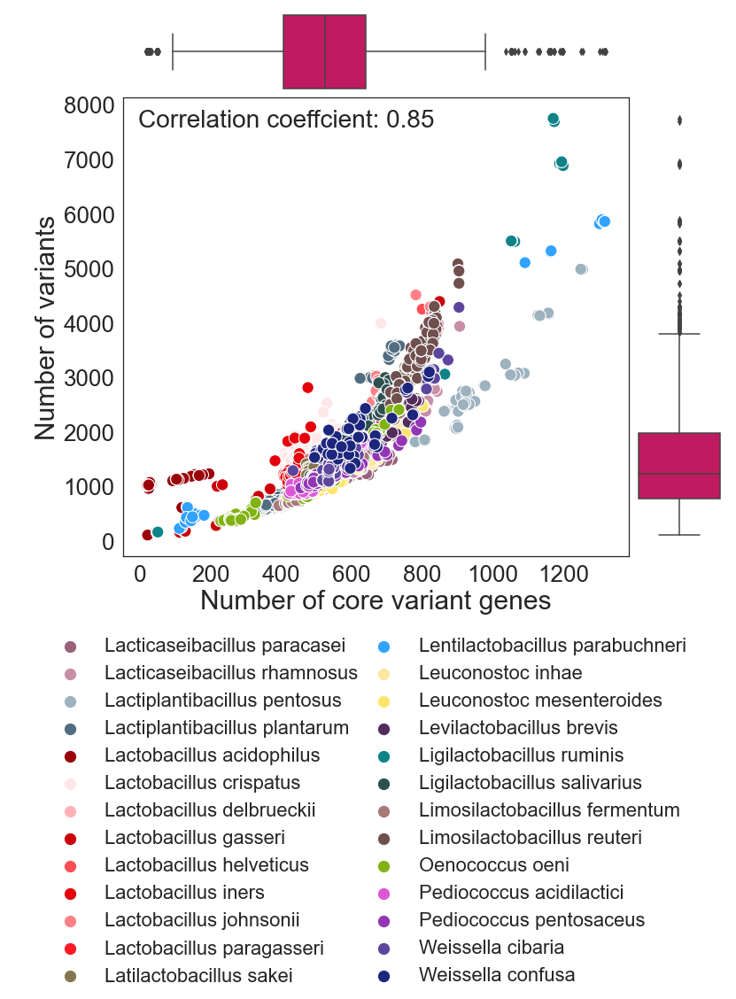

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
from scipy.stats import pearsonr



c2=pd.read_csv('lacto_all_genetic_variants_across_each_strain.csv')
c2['Species'] = c2['Species'].apply({'Pediococcus_acidilactici':'Pediococcus acidilactici','Lactobacillus_crispatus':'Lactobacillus crispatus','Lactobacillus_delbrueckii':'Lactobacillus delbrueckii','Lactobacillus_johnsonii':'Lactobacillus johnsonii','Lactobacillus_helveticus':'Lactobacillus helveticus','Lactobacillus_paragasseri':'Lactobacillus paragasseri','Pediococcus_pentosaceus':'Pediococcus pentosaceus','Lactobacillus_iners':'Lactobacillus iners','Lactobacillus_gasseri':'Lactobacillus gasseri','Lactobacillus_acidophilus':'Lactobacillus acidophilus','Weissella_confusa':'Weissella confusa','Weissella_cibaria':'Weissella cibaria','Lactiplantibacillus_plantarum':'Lactiplantibacillus plantarum','Lactiplantibacillus_pentosus':'Lactiplantibacillus pentosus','Ligilactobacillus_salivarius':'Ligilactobacillus salivarius','Ligilactobacillus_ruminis':'Ligilactobacillus ruminis','Leuconostoc_mesenteroides':'Leuconostoc mesenteroides','Leuconostoc_inhae':'Leuconostoc inhae','Lacticaseibacillus_paracasei':'Lacticaseibacillus paracasei','Lacticaseibacillus_rhamnosus':'Lacticaseibacillus rhamnosus','Oenococcus_oeni':'Oenococcus oeni','Latilactobacillus_sakei':'Latilactobacillus sakei','Lentilactobacillus_parabuchneri':'Lentilactobacillus parabuchneri','Limosilactobacillus_fermentum':'Limosilactobacillus fermentum','Limosilactobacillus_reuteri':'Limosilactobacillus reuteri','Levilactobacillus_brevis':'Levilactobacillus brevis'}.get)

col_dict={'Pediococcus pentosaceus':'#9336B4', 'Pediococcus acidilactici':'#DD58D6','Lactobacillus crispatus':'#FFE6E7','Lactobacillus delbrueckii':'#FFB3B6','Lactobacillus johnsonii':'#FF8086','Lactobacillus helveticus':'#FF4D55',
    'Lactobacillus paragasseri':'#FF1925','Lactobacillus iners':'#E6000B','Lactobacillus gasseri':'#CC000A','Lactobacillus acidophilus':'#990008','Weissella confusa':'#1D267D','Weissella cibaria':'#5C469C',
    'Lactiplantibacillus plantarum':'#526D82','Lactiplantibacillus pentosus':'#9DB2BF','Ligilactobacillus salivarius':'#2E4F4F','Ligilactobacillus ruminis':'#0E8388',
    'Leuconostoc mesenteroides':'#FFE569','Leuconostoc inhae':'#FFE7A0','Lacticaseibacillus paracasei':'#99627A','Lacticaseibacillus rhamnosus':'#C88EA7',
    'Oenococcus oeni':'#81B214','Latilactobacillus sakei':'#83764F','Lentilactobacillus parabuchneri':'#30A2FF',
    'Limosilactobacillus fermentum':'#A77979','Limosilactobacillus reuteri':'#704F4F','Levilactobacillus brevis':'#522D5B'}

x=c2['Gene_nunique']
y=c2['AA_mutation_type_count']
r = np.corrcoef(x, y)
r
#sns.set(font_scale=2.0)
sns.set(style="white")
rc={'font.size': 32, 'axes.labelsize': 32, 'legend.fontsize': 32.0, 
    'axes.titlesize': 32, 'xtick.labelsize': 32, 'ytick.labelsize': 32}


g = sns.JointGrid(c2, 
                  x="Gene_nunique",
                  y="AA_mutation_type_count", hue="Species",space=0)

# Calculate the correlation coefficient
correlation, _ = pearsonr(c2['Gene_nunique'], c2['AA_mutation_type_count'])

# Add the correlation coefficient to the plot


grid=g.plot_joint(sns.scatterplot,palette=col_dict, s=180)
g.plot_marginals(sns.boxplot, palette=['#DB005B'] )
plt.subplots_adjust(right=0.80)
legend=g.ax_joint.legend(bbox_to_anchor=(-0.16, -0.16), ncol=2, loc='upper left',columnspacing=0.3, borderaxespad=0, fontsize=22, frameon=False)
for handle in legend.legendHandles:
    handle._sizes=[150]

g.fig.set_figwidth(14)
g.fig.set_figheight(10)
g.ax_joint.set_ylabel('\nNumber of variants',fontsize=30)

g.ax_joint.set_xlabel('Number of core variant genes',fontsize=30)
g.ax_marg_x.set_facecolor('#FFFFFF')
g.ax_marg_y.set_facecolor('#FFFFFF')
plt.setp(g.ax_joint.get_xticklabels(), fontsize=26)
plt.setp(g.ax_joint.get_yticklabels(), fontsize=26)
plt.text(x=0.03, y=0.95, s=f'Correlation coeffcient: {correlation:.2f}', ha='left', va='center',fontsize=28,transform=grid.ax_joint.transAxes)



#plt.savefig("Scatterplot_with_marginal_boxplot_Seaborn.svg", format="svg")

#plt.savefig("Scatterplot_with_marginal_boxplot_Seaborn.png",
#                    format='png',dpi=600)
plt.show()


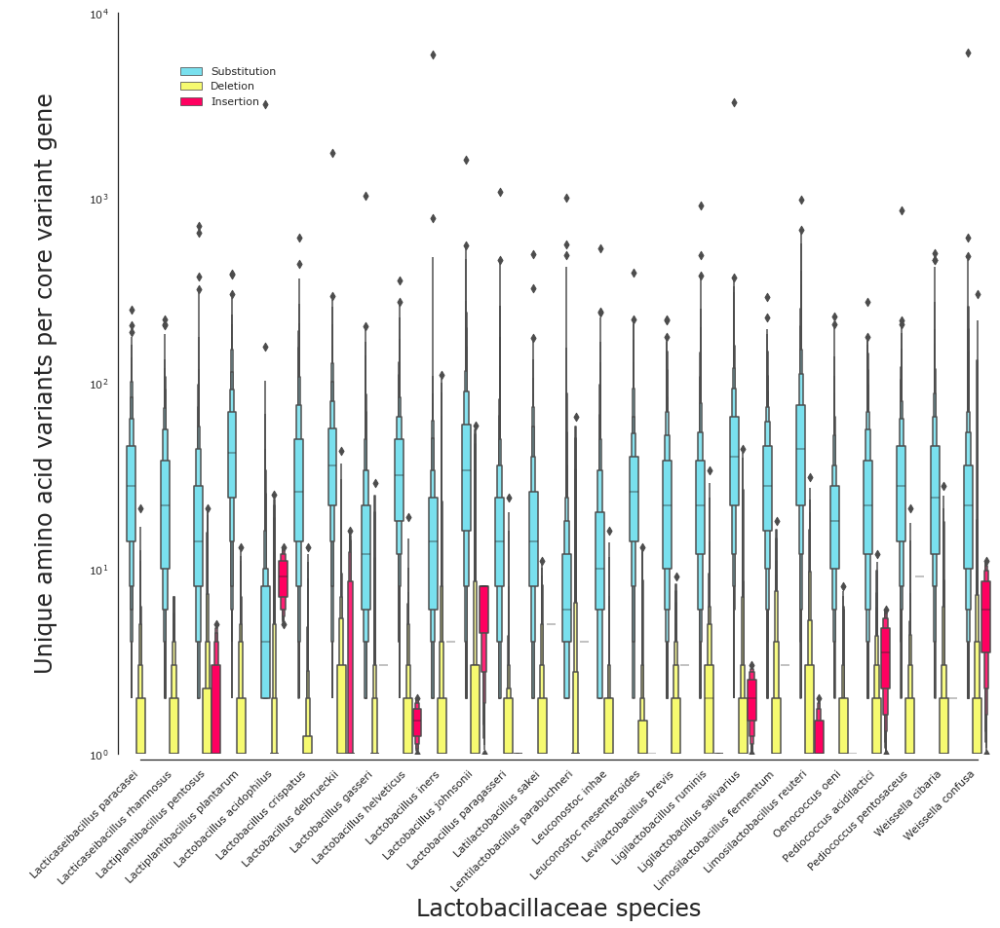

In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "Verdana"

indel=pd.read_csv('lacto_all_unique_insertion_deletion_and_substitutions_count_with_species_name.csv')
indel.sort_values(by=['Species'], inplace=True, ascending=True)
indel
fig, ax = plt.subplots(figsize=(16,14))
my_pal = {"Substitution": "#79E0EE", "Deletion": "#F6FA70", "Insertion":"#FF0060"}
#ax=sns.boxplot(data=indel, x="Mutation_count", y="Species", hue="Mutation_type",palette=sns.color_palette("Set2"))
ax=sns.boxenplot(data=indel, y="Mutation_count", x="Species", hue="Mutation_type",palette=my_pal,saturation=1,k_depth="proportion")
#ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
ax.set_ylim(1, 10000)

ax.set(yscale="log")
#plt.grid(False, which="both")
sns.despine(offset=6, trim=True)
plt.setp(ax.get_xticklabels(), rotation=45,ha='right')

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.12, 0.86), ncol=1, title=None, frameon=False,
)

#plt.title("\n")
plt.rc('font', size=28)

plt.rcParams["font.family"] = "Verdana"

plt.xlabel("Lactobacillaceae species", size=24)
plt.ylabel("\nUnique amino acid variants per core variant gene\n",size=24)
plt.savefig("unique_vars.svg", format="svg")
plt.show()

/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_31212/2378630083.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d4['Avg_uniq_var_per_gene']=d4['Mutation_count']/d4['Core_genes']
/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_31212/2378630083.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d4['Avg_uniq_var_per_gene']=d4['Avg_uniq_var_per_gene'].round(0)


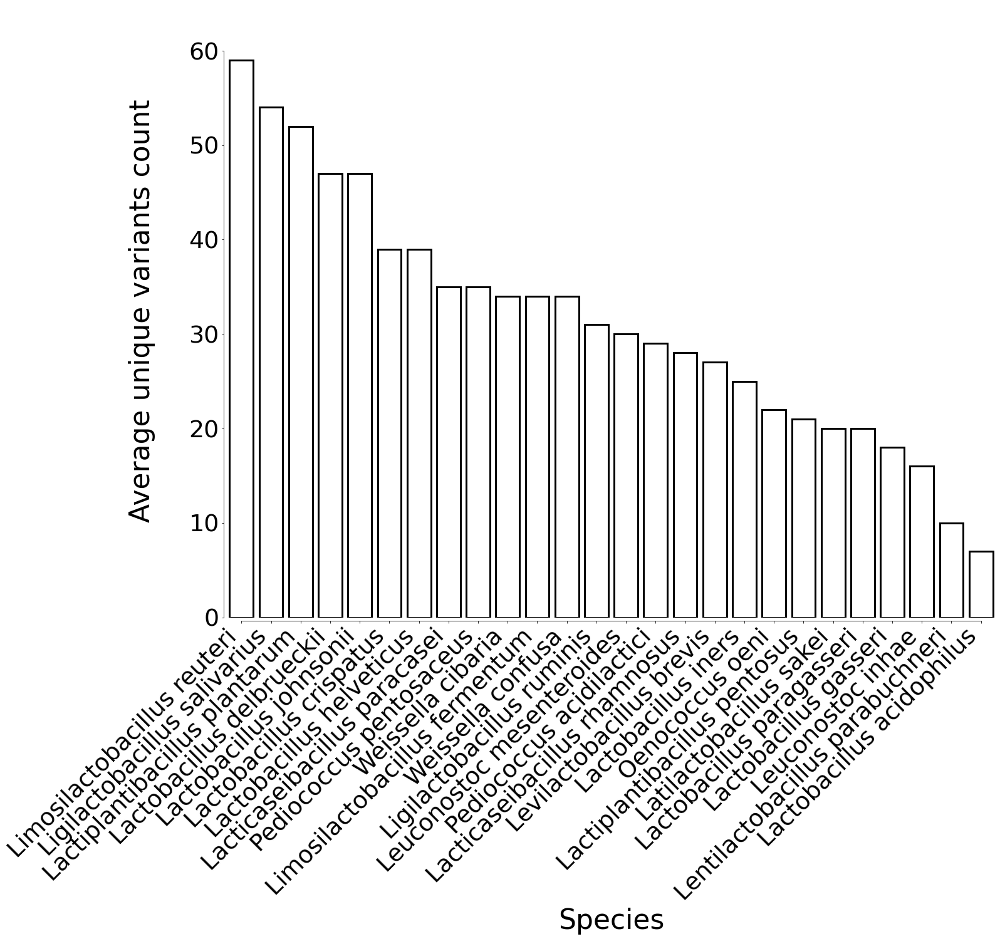

In [1]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
un=pd.read_csv('lacto_all_unique_insertion_deletion_and_substitutions_count_with_species_name.csv')
un
#unique allelic variants per gene per species. The unique variants per gene was already calculated , now added code for per species to it
un1=un.groupby('Species')['Mutation_count'].sum().reset_index()
un1
d1=pd.read_csv('lacto_all_core_genes_and_varian_genes.csv')
d1
d1['Species'] = d1['Species'].apply({'Pediococcus_acidilactici':'Pediococcus acidilactici','Lactobacillus_crispatus':'Lactobacillus crispatus','Lactobacillus_delbrueckii':'Lactobacillus delbrueckii','Lactobacillus_johnsonii':'Lactobacillus johnsonii','Lactobacillus_helveticus':'Lactobacillus helveticus','Lactobacillus_paragasseri':'Lactobacillus paragasseri','Pediococcus_pentosaceus':'Pediococcus pentosaceus','Lactobacillus_iners':'Lactobacillus iners','Lactobacillus_gasseri':'Lactobacillus gasseri','Lactobacillus_acidophilus':'Lactobacillus acidophilus','Weissella_confusa':'Weissella confusa','Weissella_cibaria':'Weissella cibaria','Lactiplantibacillus_plantarum':'Lactiplantibacillus plantarum','Lactiplantibacillus_pentosus':'Lactiplantibacillus pentosus','Ligilactobacillus_salivarius':'Ligilactobacillus salivarius','Ligilactobacillus_ruminis':'Ligilactobacillus ruminis','Leuconostoc_mesenteroides':'Leuconostoc mesenteroides','Leuconostoc_inhae':'Leuconostoc inhae','Lacticaseibacillus_paracasei':'Lacticaseibacillus paracasei','Lacticaseibacillus_rhamnosus':'Lacticaseibacillus rhamnosus','Oenococcus_oeni':'Oenococcus oeni','Latilactobacillus_sakei':'Latilactobacillus sakei','Lentilactobacillus_parabuchneri':'Lentilactobacillus parabuchneri','Limosilactobacillus_fermentum':'Limosilactobacillus fermentum','Limosilactobacillus_reuteri':'Limosilactobacillus reuteri','Levilactobacillus_brevis':'Levilactobacillus brevis'}.get)
d1
d3=pd.merge(un1, d1, on='Species')
d4=d3[['Species','Mutation_count','Core_genes']]
d4
d4['Avg_uniq_var_per_gene']=d4['Mutation_count']/d4['Core_genes']
d4
d4['Avg_uniq_var_per_gene']=d4['Avg_uniq_var_per_gene'].round(0)
d4
array=d4['Avg_uniq_var_per_gene']
d4=d4.sort_values(by='Avg_uniq_var_per_gene', ascending=False)
rank = array.argsort()
#pal = sns.color_palette("Blues_r", len(d4))
#pal=sns.color_palette("rocket", len(d4))
pal=sns.color_palette("light:b_r", len(d4))

fig, ax= plt.subplots(figsize=(22,18))
#ax1=sns.barplot(data=d4, x="Species", y="Avg_uniq_var_per_gene",width=0.9,palette=np.array(pal[::-1])[rank])

ax1=sns.barplot(data=d4, x="Species", y="Avg_uniq_var_per_gene",width=0.8,palette=['white'], edgecolor='black')
#ax2=sns.barplot(data=df2, x="Species", y="Count", hue="Num_alleles",width=0.9,palette=['red','yellow'])
plt.setp(ax.patches, linewidth=3)
ax.tick_params(axis='x', labelsize=38)
ax.tick_params(axis='y', labelsize=38)
sns.despine(offset=5, trim=True)

ax.margins(y=0.1)
plt.xticks(rotation = 45, ha="right") # Rotates X-Axis Ticks by 45-degrees
sns.despine()
#for i in ax.containers:
#    ax.bar_label(i,padding=4,fontsize=24, rotation=90)

plt.xlabel('Species',fontsize=44)
plt.ylabel('Average unique variants count\n',fontsize=44)
plt.savefig("average unique vars.svg", format="svg")
plt.show()

/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_62401/1377215961.py:73: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:
/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_62401/1377215961.py:77: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0, 10000])
/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_62401/1377215961.py:78: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim([0, 10000])


(0.5970596836351004, 10000)

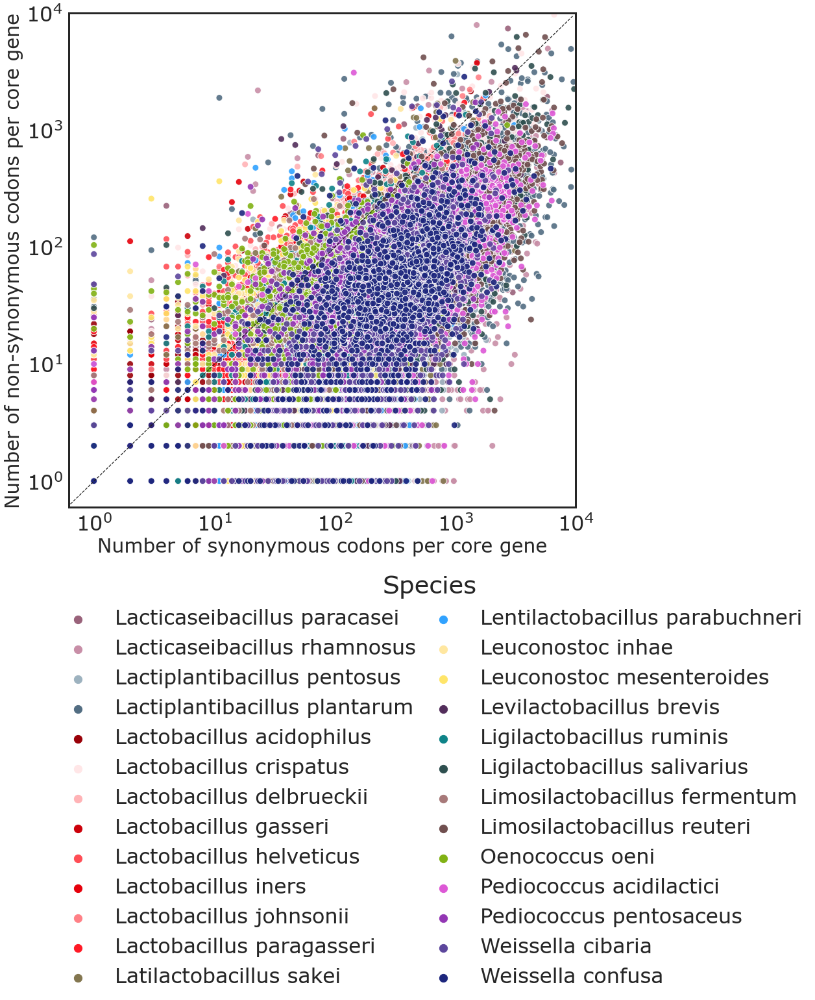

In [13]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

sns.set_theme(style="white")
#sns.despine(f, left=True, bottom=True)

b=pd.read_csv('final_dn_ds_count_per_gene_each_species.csv')
###################
#map values according to dn/ds values
conditions = [
    (b['dN/dS'] > 1 ),
    (b['dN/dS'] == 1 ),
    (b['dN/dS'] < 1 ) ,
    ]

# create a list of the values we want to assign for each condition
values = ['dN/dS > 1', 'dN/dS = 1', 'dN/dS < 1']

# create a new column and use np.select to assign values to it using our lists as arguments
b['dN/dS'] = np.select(conditions, values)
b=b.rename(columns = {'dN/dS':'dN/dS ratio'})

plt.rcParams["font.family"] = "Verdana"
plt.rc('font', size=38)
#color scheme for 26 species
color_dict = dict({'Africa':'brown',
                  'Asia':'green',
                  'Europe': 'orange',
                  'Oceania': 'red',
                   'Americas': 'dodgerblue'})
col_dict={'Pediococcus pentosaceus':'#9336B4', 'Pediococcus acidilactici':'#DD58D6','Lactobacillus crispatus':'#FFE6E7','Lactobacillus delbrueckii':'#FFB3B6','Lactobacillus johnsonii':'#FF8086','Lactobacillus helveticus':'#FF4D55',
    'Lactobacillus paragasseri':'#FF1925','Lactobacillus iners':'#E6000B','Lactobacillus gasseri':'#CC000A','Lactobacillus acidophilus':'#990008','Weissella confusa':'#1D267D','Weissella cibaria':'#5C469C',
    'Lactiplantibacillus plantarum':'#526D82','Lactiplantibacillus pentosus':'#9DB2BF','Ligilactobacillus salivarius':'#2E4F4F','Ligilactobacillus ruminis':'#0E8388',
    'Leuconostoc mesenteroides':'#FFE569','Leuconostoc inhae':'#FFE7A0','Lacticaseibacillus paracasei':'#99627A','Lacticaseibacillus rhamnosus':'#C88EA7',
    'Oenococcus oeni':'#81B214','Latilactobacillus sakei':'#83764F','Lentilactobacillus parabuchneri':'#30A2FF',
    'Limosilactobacillus fermentum':'#A77979','Limosilactobacillus reuteri':'#704F4F','Levilactobacillus brevis':'#522D5B'}

#fig, ax= plt.subplots(figsize=(16,16))
fig, ax= plt.subplots(figsize=(14,14))

# Draw a line of x=y 

ax=sns.scatterplot(x="Synonymous_count", y="Non_synonymous_count",
                hue="Species",
                palette=col_dict,
                 linewidth=1,s=100,alpha=0.9,
                data=b, ax=ax)
#legend = ax._legend
#legend.set_title("Species")
#ax.spines['left'].set_linewidth(3)
for _,s in ax.spines.items():
    s.set_linewidth(3)
#sns.move_legend(
#    ax, "lower center",
 #   bbox_to_anchor=(0.50, -1.13), ncol=2, title='Species',title_fontsize=38,fontsize="34", frameon=False,
#)

plt.xlabel('Number of synonymous codons per core gene',fontsize=30)
plt.ylabel('Number of non-synonymous codons per core gene',fontsize=30)
#legend_handles, _= ax.get_legend_handles_labels()
#ax.legend(legend_handles, [ 'Pediococcus acidilactici','Lactobacillus crispatus','Lactobacillus delbrueckii','Lactobacillus johnsonii','Lactobacillus helveticus','Lactobacillus paragasseri','Pediococcus pentosaceus','Lactobacillus iners','Lactobacillus gasseri','Lactobacillus acidophilus','Weissella confusa','Weissella cibaria','Lactiplantibacillus plantarum','Lactiplantibacillus pentosus','Ligilactobacillus salivarius','Ligilactobacillus ruminis','Leuconostoc mesenteroides','Leuconostoc inhae','Lacticaseibacillus paracasei','Lacticaseibacillus rhamnosus','Oenococcus oeni','Latilactobacillus sakei','Lentilactobacillus parabuchneri','Limosilactobacillus fermentum','Limosilactobacillus reuteri','Levilactobacillus bvrevis']
#,bbox_to_anchor=(1.26,1))
#['Pediococcus pentosaceus', 'Pediococcus acidilactici','Lactobacillus crispatus','Lactobacillus delbrueckii','Lactobacillus johnsonii','Lactobacillus helveticus','Lactobacillus paragasseri','Lactobacillus iners','Lactobacillus gasseri','Lactobacillus acidophilus','Weissella confusa','Weissella cibaria','Lactiplantibacillus plantarum','Lactiplantibacillus pentosus','Ligilactobacillus_salivarius','Ligilactobacillus ruminis','Leuconostoc mesenteroides','Leuconostoc inhae','Lacticaseibacillus paracasei','Lacticaseibacillus rhamnosus','Oenococcus oeni','Latilactobacillus sakei','Lentilactobacillus parabuchneri','Limosilactobacillus fermentum','Limosilactobacillus reuteri','Levilactobacillus brevis']
t = np.arange(0, 9400., 0.995)
plt.plot(t, 'k--',linewidth=1.2)
plt.yticks(fontsize=32)
plt.xticks(fontsize=32)
#plt.legend(title='Day', ncol=2, loc='upper center', bbox_to_anchor=(0.5, -0.2))

legend=plt.legend(bbox_to_anchor=(-0.06, -0.10), ncol=2, title='Species',columnspacing=0.3,title_fontsize=38,fontsize="32", frameon=False)
for handle in legend.legendHandles:
    handle._sizes=[150]
plt.xscale('log')
plt.yscale('log')
plt.xlim([0, 10000])
plt.ylim([0, 10000])



/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_62401/2530676581.py:63: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0, 10000])
/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_62401/2530676581.py:64: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim([0, 10000])


(0.5939097651209824, 10000)

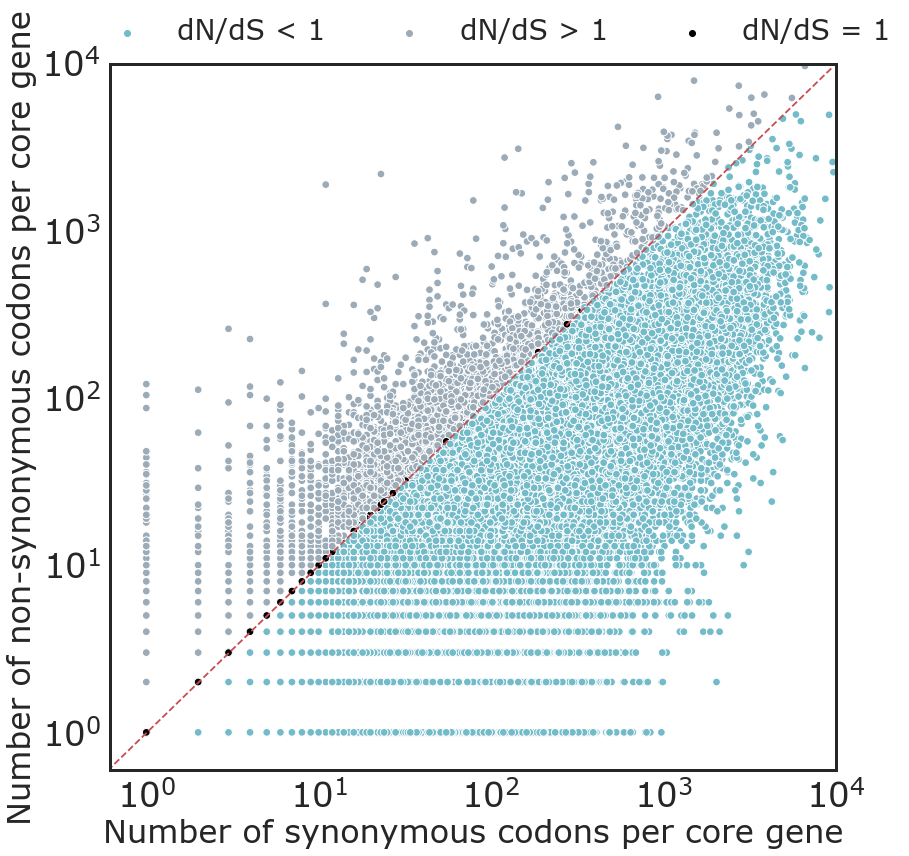

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
#sns.set_theme(style="white")
#sns.despine(f, left=True, bottom=True)

b=pd.read_csv('final_dn_ds_count_per_gene_each_species.csv')
b=b.rename(columns = {'dN/dS ratio':'dN/dS'})

###################
#map values according to dn/ds values
conditions = [
    (b['dN/dS'] > 1 ),
    (b['dN/dS'] == 1 ),
    (b['dN/dS'] < 1 ) ,
    ] 

# create a list of the values we want to assign for each condition
values = ['dN/dS > 1', 'dN/dS = 1', 'dN/dS < 1']

# create a new column and use np.select to assign values to it using our lists as arguments
b['dN/dS'] = np.select(conditions, values)
##################

plt.rcParams["font.family"] = "Verdana"
plt.rc('font', size=25)
#color scheme for 26 species
color_dict = dict({'Africa':'brown',
                  'Asia':'green',
                  'Europe': 'orange',
                  'Oceania': 'red',
                   'Americas': 'dodgerblue'})
col_dict={'Pediococcus_pentosaceus':'#9336B4', 'Pediococcus_acidilactici':'#DD58D6','Lactobacillus_crispatus':'#FFE6E7','Lactobacillus_delbrueckii':'#FFB3B6','Lactobacillus_johnsonii':'#FF8086','Lactobacillus_helveticus':'#FF4D55',
    'Lactobacillus_paragasseri':'#FF1925','Lactobacillus_iners':'#E6000B','Lactobacillus_gasseri':'#CC000A','Lactobacillus_acidophilus':'#990008','Weissella_confusa':'#1D267D','Weissella_cibaria':'#5C469C',
    'Lactiplantibacillus_plantarum':'#526D82','Lactiplantibacillus_pentosus':'#9DB2BF','Ligilactobacillus_salivarius':'#2E4F4F','Ligilactobacillus_ruminis':'#0E8388',
    'Leuconostoc_mesenteroides':'#FFE569','Leuconostoc_inhae':'#FFE7A0','Lacticaseibacillus_paracasei':'#99627A','Lacticaseibacillus_rhamnosus':'#C88EA7',
    'Oenococcus_oeni':'#81B214','Latilactobacillus_sakei':'#83764F','Lentilactobacillus_parabuchneri':'#30A2FF',
    'Limosilactobacillus_fermentum':'#A77979','Limosilactobacillus_reuteri':'#704F4F','Levilactobacillus_brevis':'#522D5B'}

fig, ax= plt.subplots(figsize=(13,13))
# Draw a line of x=y 
for _,s in ax.spines.items():
    s.set_linewidth(3)
t = np.arange(0., 9500., 0.99)
plt.plot(t, 'r--',linewidth=1.8)

sns.scatterplot(x="Synonymous_count", y="Non_synonymous_count",
                 linewidth=1,hue='dN/dS',s=60,palette=['#73BBC9','#9BABB8','black'],
                data=b, ax=ax)
plt.xlabel('Number of synonymous codons per core gene',fontsize=32)
plt.ylabel('Number of non-synonymous codons per core gene',fontsize=32)
sns.move_legend(
    ax, "upper center",
    bbox_to_anchor=(0.53, 1.10), ncol=3, title=None,fontsize="28", frameon=False,
)
plt.yticks(fontsize=34)
plt.xticks(fontsize=34)


plt.xscale('log')
plt.yscale('log')
plt.xlim([0, 10000])
plt.ylim([0, 10000])

#t = np.arange(0., 9500., 0.99)
#plt.plot(t, 'r--',linewidth=1.8)


/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_62401/969842823.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b1['dN/dS'] = np.select(conditions, values)


(array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05]),
 [Text(0.01, 0, '$\\mathdefault{10^{-2}}$'),
  Text(0.1, 0, '$\\mathdefault{10^{-1}}$'),
  Text(1.0, 0, '$\\mathdefault{10^{0}}$'),
  Text(10.0, 0, '$\\mathdefault{10^{1}}$'),
  Text(100.0, 0, '$\\mathdefault{10^{2}}$'),
  Text(1000.0, 0, '$\\mathdefault{10^{3}}$'),
  Text(10000.0, 0, '$\\mathdefault{10^{4}}$'),
  Text(100000.0, 0, '$\\mathdefault{10^{5}}$')])

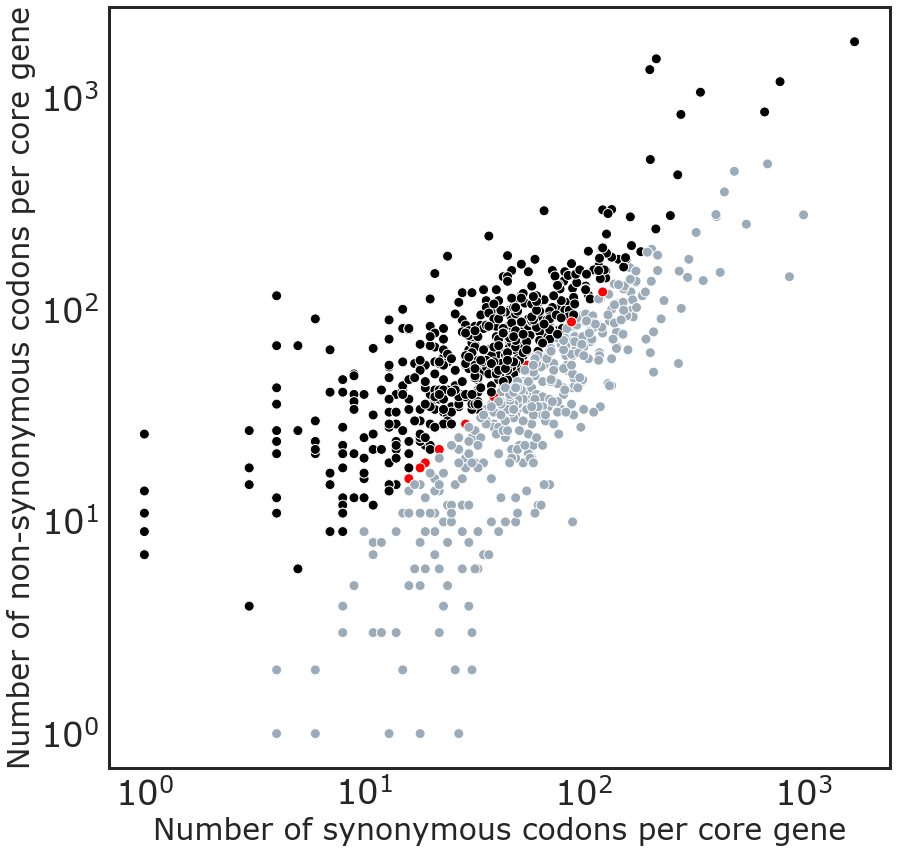

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
#sns.set_theme(style="white")
#sns.despine(f, left=True, bottom=True)

b=pd.read_csv('final_dn_ds_count_per_gene_each_species.csv')
b1=b[b.Species == 'Lactobacillus helveticus']
###################
#map values according to dn/ds values
conditions = [
    (b1['dN/dS'] > 1 ),
    (b1['dN/dS'] == 1 ),
    (b1['dN/dS'] < 1 ) ,
    ]

# create a list of the values we want to assign for each condition
values = ['dN/dS > 1', 'dN/dS = 1', 'dN/dS < 1']

# create a new column and use np.select to assign values to it using our lists as arguments
b1['dN/dS'] = np.select(conditions, values)
##################

#plt.rcParams["font.family"] = "Verdana"
#plt.rc('font', size=18)
#color scheme for 26 species
color_dict = dict({'Africa':'brown',
                  'Asia':'green',
                  'Europe': 'orange',
                  'Oceania': 'red',
                   'Americas': 'dodgerblue'})
col_dict={'Pediococcus_pentosaceus':'#9336B4', 'Pediococcus_acidilactici':'#DD58D6','Lactobacillus_crispatus':'#FFE6E7','Lactobacillus_delbrueckii':'#FFB3B6','Lactobacillus_johnsonii':'#FF8086','Lactobacillus_helveticus':'#FF4D55',
    'Lactobacillus_paragasseri':'#FF1925','Lactobacillus_iners':'#E6000B','Lactobacillus_gasseri':'#CC000A','Lactobacillus_acidophilus':'#990008','Weissella_confusa':'#1D267D','Weissella_cibaria':'#5C469C',
    'Lactiplantibacillus_plantarum':'#526D82','Lactiplantibacillus_pentosus':'#9DB2BF','Ligilactobacillus_salivarius':'#2E4F4F','Ligilactobacillus_ruminis':'#0E8388',
    'Leuconostoc_mesenteroides':'#FFE569','Leuconostoc_inhae':'#FFE7A0','Lacticaseibacillus_paracasei':'#99627A','Lacticaseibacillus_rhamnosus':'#C88EA7',
    'Oenococcus_oeni':'#81B214','Latilactobacillus_sakei':'#83764F','Lentilactobacillus_parabuchneri':'#30A2FF',
    'Limosilactobacillus_fermentum':'#A77979','Limosilactobacillus_reuteri':'#704F4F','Levilactobacillus_brevis':'#522D5B'}

fig, ax= plt.subplots(figsize=(14,14))
# Draw a line of x=y 

sns.scatterplot(x="Synonymous_count", y="Non_synonymous_count",
                 linewidth=1,hue='dN/dS',s=100,palette=['black','#9BABB8','red'],
                data=b1, ax=ax, legend=False)
for _,s in ax.spines.items():
    s.set_linewidth(3)

plt.xlabel('Number of synonymous codons per core gene',fontsize=30)
plt.ylabel('Number of non-synonymous codons per core gene',fontsize=30)
#plt.title('Lactobacillus helveticus\n', fontsize=26, weight="bold")
plt.xscale('log')
plt.yscale('log')
plt.yticks(fontsize=34)
plt.xticks(fontsize=34)

#plt.xlim([0, 10000])
#plt.ylim([0, 10000])

#t = np.arange(0., 9700., 0.99)
#plt.plot(t, 'r--',linewidth=1.6)


/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_45416/3510096355.py:19: MatplotlibDeprecationWarning: Passing the emit parameter of set_xlim() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ax.set_xlim(0, 1800, 500)


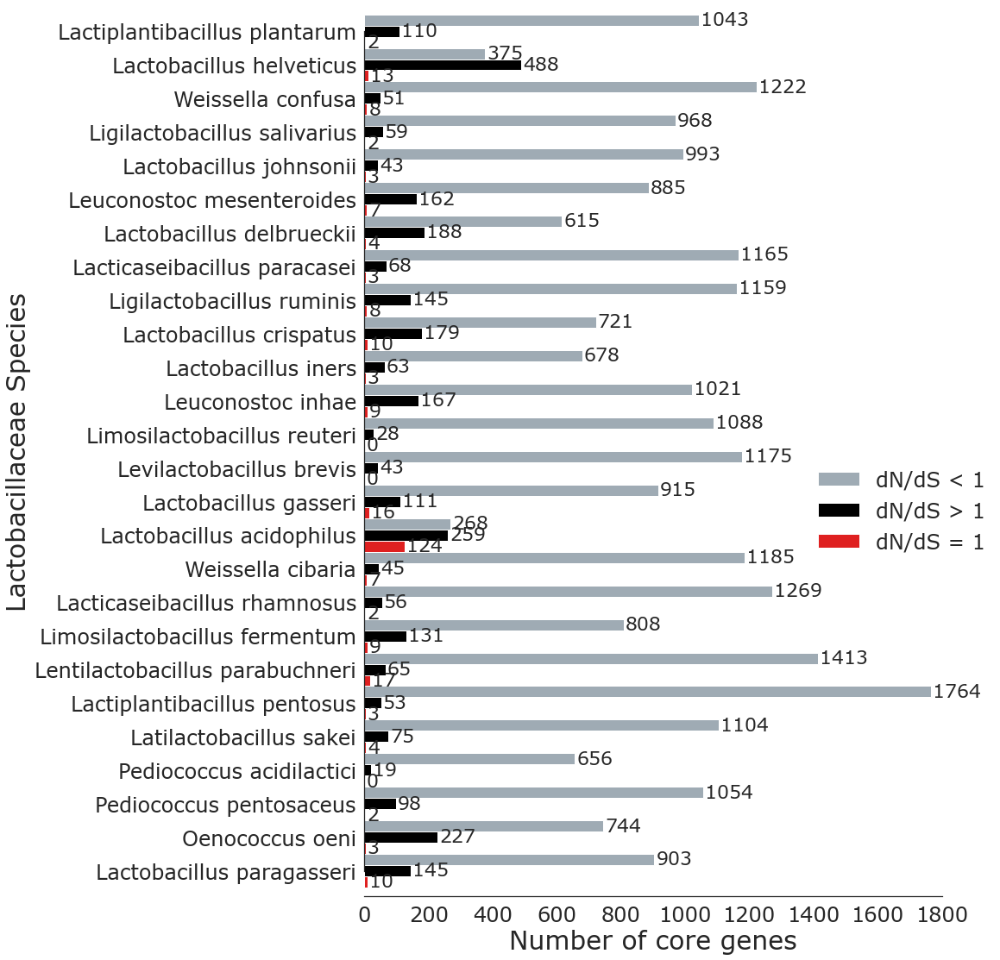

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df1=pd.read_csv('lacto_all_count_of_genes_with_dnds_ratio_count_classi.csv', index_col=0)
df1.head()

#df1['Species'] = df1['Species'].apply({'Pediococcus_acidilactici':'Pediococcus acidilactici','Lactobacillus_crispatus':'Lactobacillus crispatus','Lactobacillus_delbrueckii':'Lactobacillus delbrueckii','Lactobacillus_johnsonii':'Lactobacillus johnsonii','Lactobacillus_helveticus':'Lactobacillus helveticus','Lactobacillus_paragasseri':'Lactobacillus paragasseri','Pediococcus_pentosaceus':'Pediococcus pentosaceus','Lactobacillus_iners':'Lactobacillus iners','Lactobacillus_gasseri':'Lactobacillus gasseri','Lactobacillus_acidophilus':'Lactobacillus acidophilus','Weissella_confusa':'Weissella confusa','Weissella_cibaria':'Weissella cibaria','Lactiplantibacillus_plantarum':'Lactiplantibacillus plantarum','Lactiplantibacillus_pentosus':'Lactiplantibacillus pentosus','Ligilactobacillus_salivarius':'Ligilactobacillus salivarius','Ligilactobacillus_ruminis':'Ligilactobacillus ruminis','Leuconostoc_mesenteroides':'Leuconostoc mesenteroides','Leuconostoc_inhae':'Leuconostoc inhae','Lacticaseibacillus_paracasei':'Lacticaseibacillus paracasei','Lacticaseibacillus_rhamnosus':'Lacticaseibacillus rhamnosus','Oenococcus_oeni':'Oenococcus oeni','Latilactobacillus_sakei':'Latilactobacillus sakei','Lentilactobacillus_parabuchneri':'Lentilactobacillus parabuchneri','Limosilactobacillus_fermentum':'Limosilactobacillus fermentum','Limosilactobacillus_reuteri':'Limosilactobacillus reuteri','Levilactobacillus_brevis':'Levilactobacillus brevis'}.get)

df2=df1.melt(id_vars=["Species"], 
        var_name="dn/ds", 
       value_name="Gene_count")
fig, ax= plt.subplots(figsize=(12,19))
#df2=df2.sort_values(by=['Gene_count'],ascending=False)

ax=sns.barplot(data=df2, y="Species", x="Gene_count", hue="dn/ds",width=1,palette=['#9BABB8','black','red'])
for i in ax.containers:
    ax.bar_label(i,padding=2,fontsize=22)
#ax.tick_params(axis='x', labelsize=18)
ax.set_xlim(0, 1800, 500)
sns.despine(trim=True)
plt.ylabel("Lactobacillaceae Species", fontsize=30)
plt.xlabel("Number of core genes",fontsize=30)
ax.margins(y=0.01)
plt.yticks(fontsize=24)
plt.xticks(fontsize=24)
sns.move_legend(
    ax, "upper center",
    bbox_to_anchor=(0.93, 0.50), ncol=1, title=None,fontsize="24", frameon=False,
)


/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_62401/281413748.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_1['GS'] = np.select(conditions, values)
/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_62401/281413748.py:75: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  g=sns.barplot(x=final_1.index, y=final_1.mut_count,hue=final_1.GS,ci=None,width=1,palette=gs_dict,dodge=False)


Text(0, 0.5, 'Grantham score')

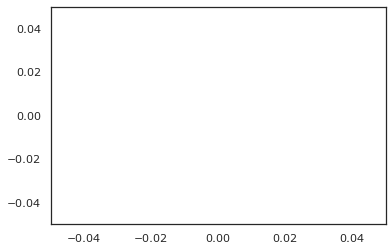

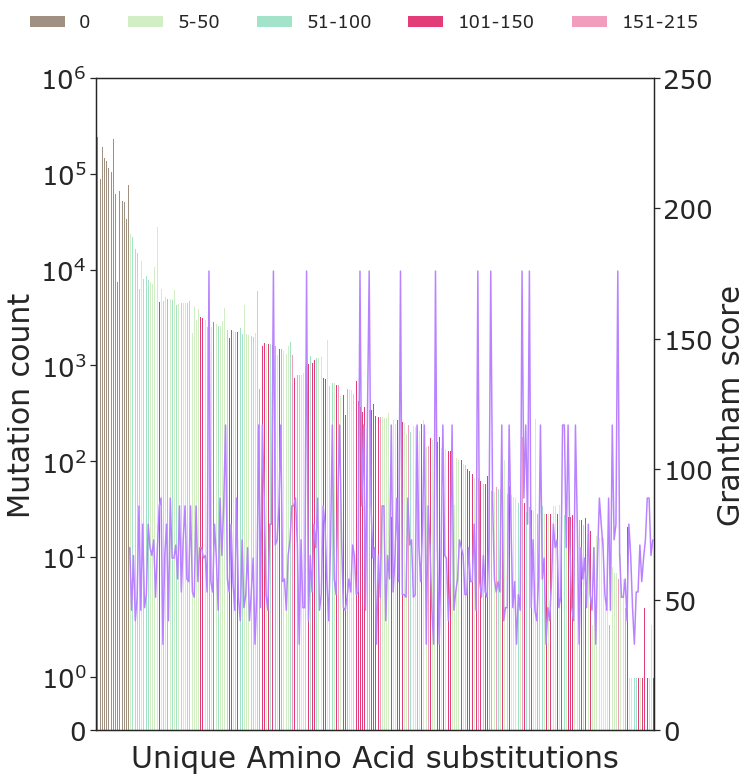

In [15]:
ec1=pd.read_csv('lplanta_syno_non_syno_and_grantham_score_without_stop_codons.csv', index_col=0)
ec1

non_syno=ec1[ec1.AA_mutation_effect == 'Non-synonymous']
non_syno

#ec1 = ec1.drop('Grantham_dist', axis=1)
syno=ec1[ec1.AA_mutation_effect == 'Synonymous']
non_syno
ns1=non_syno[['Query_aa','AA_mutation_effect','Grantham_dist']].groupby(non_syno['Cons_aa']).value_counts().reset_index(name='mut_count')
ns1
ns2=ns1.assign(aa_substitution=ns1.Cons_aa.astype(str) + " - " + ns1.Query_aa.astype(str))
ns2.head()
#ns2=ns2.set_index('aa_substitution')
ns2.head()

#2- synonymous codon substitution count
s1=syno[['Query_aa','AA_mutation_effect']].groupby(syno['Cons_aa']).value_counts().reset_index(name='mut_count')
s1
s2=s1.assign(aa_substitution=s1.Cons_aa.astype(str) + " - " + s1.Query_aa.astype(str))
s2.head()
#s2=s2.set_index('aa_substitution')
s2
all_gs = pd.concat([s2, ns2])
all_gs=all_gs.sort_values(by='mut_count', ascending=False)
all_gs
ns_a=pd.read_csv('lplanta_aa_sub_non_syno_avg_gs.csv')
#syno amino
s_a=pd.read_csv('lplanta_aa_sub_count_syno.csv')
#ns_a=ns_a.set_index('aa_substitution')
ns_a['Mutation_type']='Non-synonymous'
s_a['Mutation_type']='Synonymous'
ns_a
s_a
s_a1=s_a[['aa_substitution','Mutation_type','Cons_aa','Query_aa']]
ns_a1=ns_a[['aa_substitution','Mutation_type','Cons_aa','Query_aa','Average_GS']]
all_ = pd.concat([s_a1, ns_a1])
all_gs=all_gs.sort_values(by='mut_count', ascending=False)
all_
all_1=all_.assign(cumAverage=all_.groupby('Cons_aa', sort=False)['Average_GS'].transform(lambda x: x.expanding().mean()))
all_1.head(50)
final=all_gs.merge(all_1,on=['aa_substitution'],how='outer')
final
final=final.sort_values(by='AA_mutation_effect', ascending=False)
final=final.set_index('aa_substitution')
final=final.sort_values(by='AA_mutation_effect', ascending=False)
final_1=final[['AA_mutation_effect','Grantham_dist','mut_count','cumAverage']]
final_1

#final.to_csv('try.csv')
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
fig, ax1 = plt.subplots()
#final_1=final.sort_values(by='AA_mutation_effect', ascending=False)

conditions = [
    (final_1['Grantham_dist'] == 0),
    ((final_1['Grantham_dist'] > 5) &  (final_1['Grantham_dist'] <= 50)),
    ((final_1['Grantham_dist'] > 50) &  (final_1['Grantham_dist'] <= 100) ),
    ((final_1['Grantham_dist'] > 100) &  (final_1['Grantham_dist'] <= 150) ) ,
    ((final_1['Grantham_dist'] > 150) &  (final_1['Grantham_dist'] <= 215))
    ]

# create a list of the values we want to assign for each condition
values = ['0', '5-50', '51-100','101-150','151-215']
gs_dict={'0':'#A4907C', '5-50':'#98EECC', '51-100':'#D0F5BE','101-150':'#FF2171','151-215':'#FF90BB'}
#palette=['#A4907C','#98EECC','#D0F5BE','#FF90BB','#FF2171']
# create a new column and use np.select to assign values to it using our lists as arguments
final_1['GS'] = np.select(conditions, values)
plt.figure(figsize=(10,12))


g=sns.barplot(x=final_1.index, y=final_1.mut_count,hue=final_1.GS,ci=None,width=1,palette=gs_dict,dodge=False)
ax1.autoscale(tight=True)
plt.yticks(fontsize=26)
plt.xticks(fontsize=26)
#ax.set(xlabel='Amino Acid substitution', ylabel='Mutation count')
plt.ylabel('Mutation count',fontsize=30)
plt.xlabel('Unique Amino Acid substitutions',fontsize=30)
g.legend( loc ="upper center",bbox_to_anchor=(0.48, 1.11),ncol=5,fontsize=18, frameon=False,borderaxespad=0., labels=values )

plt.yscale('symlog')
plt.ylim(0,1000000)
ax1 = plt.twinx()
#final_1 = final_1.reset_index()
g.set(xticklabels=[])  # remove the tick labels
g.tick_params(bottom=False)  # remove the ticks

g1=sns.lineplot(data=final_1,x='aa_substitution', y='cumAverage', color='#B983FF')
ax1.autoscale(tight=True)
plt.ylim(0,250)
plt.yticks(fontsize=26)
plt.ylabel('Grantham score',fontsize=30)


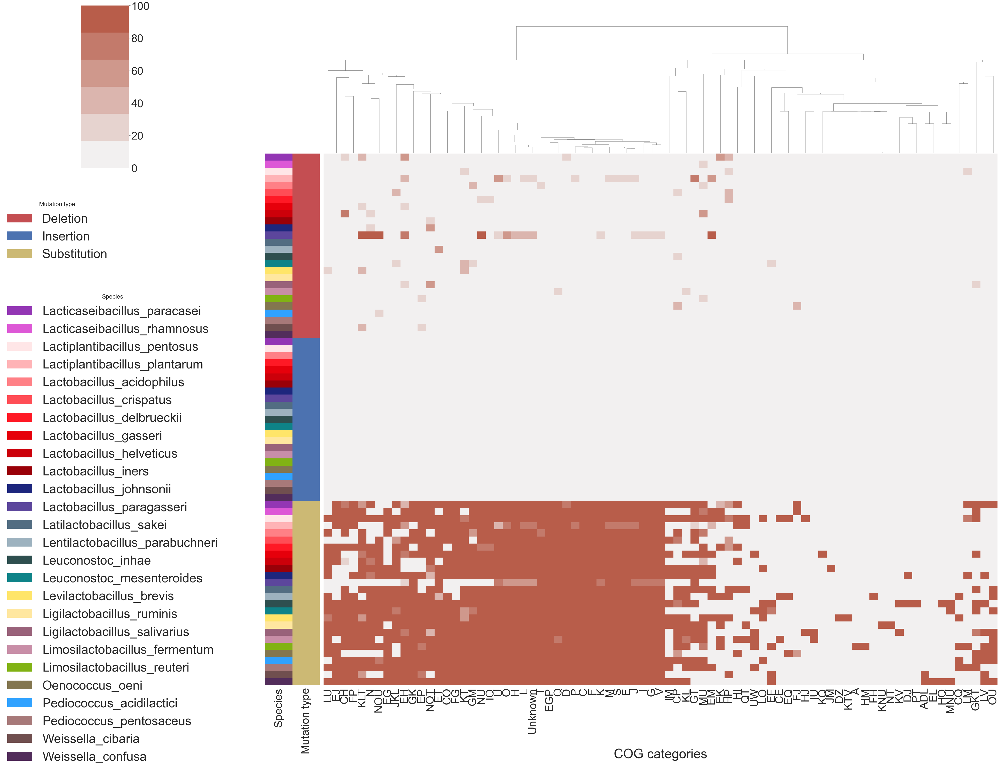

In [12]:
import pandas as pd
import seaborn as sns
from matplotlib.pyplot import gcf
import matplotlib.pyplot as plt

df=pd.read_csv('lacto_all_26_species_cog_vars_with_mutation_type_with_total_and_percentage.csv', index_col=0)
#df1=df[['Species','AA_mutation_type','COG_category','Percentage']]
#df1
df.loc[df["COG_category"] == "-", "COG_category"] = 'Unknown'
table = pd.pivot_table(df, values=['Percentage'], index=['AA_mutation_type','Species'],columns=['COG_category'],aggfunc='sum').fillna(0)
table
table.columns = table.columns
table.reset_index()
#df1=table.T
#df1
table
table.columns = table.columns.get_level_values(1)
table
t=table.reset_index()
mut = t.pop("AA_mutation_type")
sp=t.pop("Species")
#print(mut)
#print(sp)
t.head()
lut = dict(zip(mut.unique(), "rby"))
lut
mut_colors = mut.map(lut)

#print(row_colors)
#sp_pal = sns.cubehelix_palette(sp.unique().size,
#                                    light=1, dark=0, reverse=True,
#                                    start=2, rot=-6)
#sp_pal=sns.husl_palette(26)

sp_pal=['#9336B4','#DD58D6','#FFE6E7','#FFB3B6','#FF8086','#FF4D55','#FF1925','#E6000B','#CC000A','#990008','#1D267D','#5C469C', '#526D82','#9DB2BF','#2E4F4F','#0E8388','#FFE569','#FFE7A0','#99627A','#C88EA7','#81B214','#83764F','#30A2FF','#A77979','#704F4F','#522D5B']

sp_lut = dict(zip(map(str, sp.unique()), sp_pal))
#print(sp_lut)

sp_colors = pd.Series(sp).map(sp_lut)
#print(sample_cols)

row_colors = pd.DataFrame({'Species':sp_colors,'Mutation type':mut_colors})
#print(row_colors)
#g = sns.clustermap(t, row_colors=row_colors,row_cluster=False)
#plt.figure(figsize=(60, 38))
#co=sns.light_palette("#a275ac", as_cmap=True)

co=sns.light_palette((20, 60, 50), input="husl")
g=sns.clustermap(t,row_colors=row_colors,row_cluster=False,col_cluster=True,yticklabels=False,xticklabels=True,figsize=(40, 20), cmap=co)
g.fig.set_size_inches((53,50))
sns.set(font_scale=2.0) # font size 2
#g.set_xlabel("My Label")

for label in mut.unique():
    g.ax_col_dendrogram.bar(0, 0, color=lut[label], label=label, linewidth=0);
l1 = g.ax_col_dendrogram.legend(title='Mutation type', loc="center",fontsize=50, ncol=1, bbox_to_anchor=(-0.005, 0.73), bbox_transform=gcf().transFigure, frameon=False)

for label in sp.unique():
    g.ax_row_dendrogram.bar(0, 0, color=sp_lut[label], label=label, linewidth=0);
l2 = g.ax_row_dendrogram.legend(title='Species', loc="center", ncol=1, fontsize=50,bbox_to_anchor=(0.053, 0.40), bbox_transform=gcf().transFigure,frameon=False)
#how to add other row dendrograms here without them overlapping with the existing ones?
plt.rcParams["axes.labelsize"] = 30
g.ax_heatmap.set_xlabel('\nCOG categories',fontsize=52)
plt.savefig("COG_n1.svg", format="svg")

plt.show()


In [13]:
import plotly.express as px
import plotly.io as pio
import pandas as pd

df3=pd.read_csv('Strain_counts_and_var_counts_in_source_class_lacto_all_species.csv', index_col=0)
df3['Species'] = df3['Species'].apply({'Pediococcus_acidilactici':'Pediococcus acidilactici','Lactobacillus_crispatus':'Lactobacillus crispatus','Lactobacillus_delbrueckii':'Lactobacillus delbrueckii','Lactobacillus_johnsonii':'Lactobacillus johnsonii','Lactobacillus_helveticus':'Lactobacillus helveticus','Lactobacillus_paragasseri':'Lactobacillus paragasseri','Pediococcus_pentosaceus':'Pediococcus pentosaceus','Lactobacillus_iners':'Lactobacillus iners','Lactobacillus_gasseri':'Lactobacillus gasseri','Lactobacillus_acidophilus':'Lactobacillus acidophilus','Weissella_confusa':'Weissella confusa','Weissella_cibaria':'Weissella cibaria','Lactiplantibacillus_plantarum':'Lactiplantibacillus plantarum','Lactiplantibacillus_pentosus':'Lactiplantibacillus pentosus','Ligilactobacillus_salivarius':'Ligilactobacillus salivarius','Ligilactobacillus_ruminis':'Ligilactobacillus ruminis','Leuconostoc_mesenteroides':'Leuconostoc mesenteroides','Leuconostoc_inhae':'Leuconostoc inhae','Lacticaseibacillus_paracasei':'Lacticaseibacillus paracasei','Lacticaseibacillus_rhamnosus':'Lacticaseibacillus rhamnosus','Oenococcus_oeni':'Oenococcus oeni','Latilactobacillus_sakei':'Latilactobacillus sakei','Lentilactobacillus_parabuchneri':'Lentilactobacillus parabuchneri','Limosilactobacillus_fermentum':'Limosilactobacillus fermentum','Limosilactobacillus_reuteri':'Limosilactobacillus reuteri','Levilactobacillus_brevis':'Levilactobacillus brevis'}.get)

df3 = df3.drop(df3[(df3.Source_class  == 'Unknown')].index)

import numpy as np
fig = px.treemap(df3, path=[px.Constant("Lactobacillus family"), 'Genus', 'Species','Source_class','Total strains'], values='Variant %',
                  color='Genus',
                  width = 1150,height = 950)
fig.update_traces(root_color="black",textinfo = "label+value")

#color_continuous_scale='Blues',
fig.update_layout(font=dict(
        family="Times Roman",
        size=16))
#shows variant % and strain count
fig.data[0].customdata = fig.data[0].marker.colors
fig.update_traces(root_color="lightgrey")

fig.update_layout(margin = dict(t=40, l=50, r=40, b=40))
fig.show()
fig.write_image("all_species_source_treemap.png")


In [14]:
import pandas as pd
df3=pd.read_csv('Strain_counts_and_var_counts_in_source_class_lacto_all_species.csv', index_col=0)
#df3 = df3.drop(df3[(df3.Source_class  == 'Unknown')].index)
df3['Species'] = df3['Species'].apply({'Pediococcus_acidilactici':'Pediococcus acidilactici','Lactobacillus_crispatus':'Lactobacillus crispatus','Lactobacillus_delbrueckii':'Lactobacillus delbrueckii','Lactobacillus_johnsonii':'Lactobacillus johnsonii','Lactobacillus_helveticus':'Lactobacillus helveticus','Lactobacillus_paragasseri':'Lactobacillus paragasseri','Pediococcus_pentosaceus':'Pediococcus pentosaceus','Lactobacillus_iners':'Lactobacillus iners','Lactobacillus_gasseri':'Lactobacillus gasseri','Lactobacillus_acidophilus':'Lactobacillus acidophilus','Weissella_confusa':'Weissella confusa','Weissella_cibaria':'Weissella cibaria','Lactiplantibacillus_plantarum':'Lactiplantibacillus plantarum','Lactiplantibacillus_pentosus':'Lactiplantibacillus pentosus','Ligilactobacillus_salivarius':'Ligilactobacillus salivarius','Ligilactobacillus_ruminis':'Ligilactobacillus ruminis','Leuconostoc_mesenteroides':'Leuconostoc mesenteroides','Leuconostoc_inhae':'Leuconostoc inhae','Lacticaseibacillus_paracasei':'Lacticaseibacillus paracasei','Lacticaseibacillus_rhamnosus':'Lacticaseibacillus rhamnosus','Oenococcus_oeni':'Oenococcus oeni','Latilactobacillus_sakei':'Latilactobacillus sakei','Lentilactobacillus_parabuchneri':'Lentilactobacillus parabuchneri','Limosilactobacillus_fermentum':'Limosilactobacillus fermentum','Limosilactobacillus_reuteri':'Limosilactobacillus reuteri','Levilactobacillus_brevis':'Levilactobacillus brevis'}.get)

df4=df3[df3.Species == 'Lactiplantibacillus plantarum']
df4
#df4 = df4.drop(df4[(df4.Source_class  == 'Unknown')].index)

fig = px.treemap(df4, path=[px.Constant("Variant distribution across strains in Lactiplantibacillus plantarum"), 'Source_class','GCF_id'], values='Variant %',
                  color_continuous_scale='Blues',width = 1050,height = 950)
fig.update_layout(font=dict(
        family="Times Roman",
        size=30))
fig.update_traces(root_color="lightgray",textinfo = "label+value")
fig.data[0].customdata = fig.data[0].marker.colors

fig.update_layout(margin = dict(t=40, l=50, r=40, b=40))
fig.show()
fig.write_image("lplant_source_treemap.png")


Text(0.5, 0, 'Number of unique amino acid variants per gene')

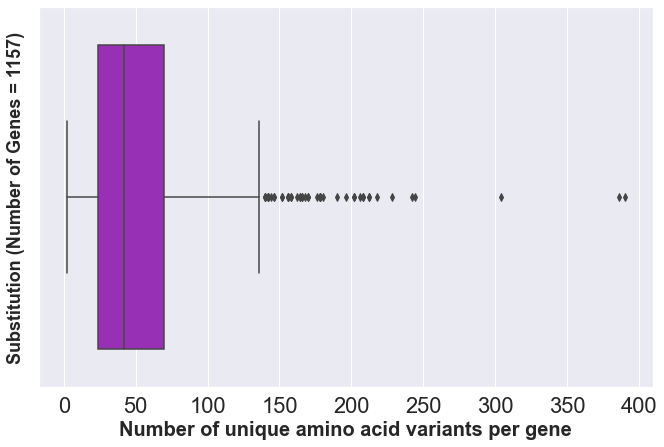

In [15]:
#box plot of unique variants of each gene
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
df=pd.read_csv('core_pan_aa_thresh_count_of_uniq_variants_per_gene.csv')
df
fig, ax = plt.subplots(figsize=(11, 7))

sns.boxplot(x=df['Unique_vars'], color='#A31ACB')
plt.ylabel("Substitution (Number of Genes = 1157)", fontsize=18, weight='bold')
plt.xlabel("Number of unique amino acid variants per gene", fontsize=20,weight='bold')


(85140, 18)


(164, 4)

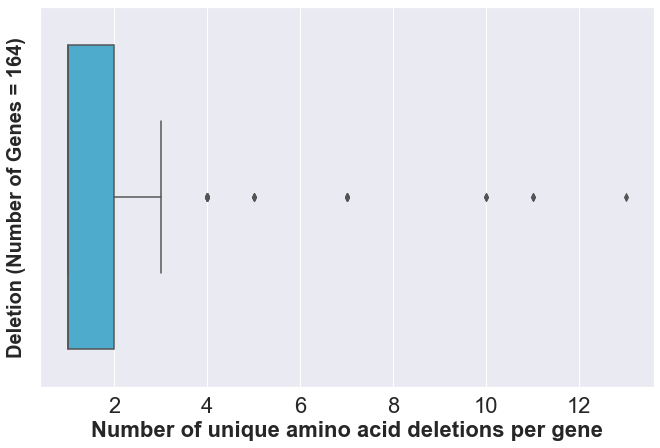

In [17]:
#all core gene vars with sub,ins and del
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df1=pd.read_csv('core_pan_aa_gene_vars_thresh_df.csv')
df1
gene_var_df_del = df1[df1.AA_mutation_type=='Deletion'] 
gene_var_df_del.to_csv('core_pan_aa_thresh_var_deletions.csv')

del_df=pd.read_csv('core_pan_aa_thresh_var_deletions.csv')
print(del_df.shape)
count_del=del_df[['GCF_id','AA_cons_seq','AA_start_pos','AA_end_pos']].groupby(del_df['Gene']).value_counts().reset_index(name='del_count_per_gene')
count_del
fig, ax = plt.subplots(figsize=(11, 7))

uniq_count_del_df = count_del.groupby(by=['Gene','AA_cons_seq','AA_start_pos','AA_end_pos'], as_index=False).first()
uniq_count_del_df

del_un=uniq_count_del_df.groupby('Gene').sum().reset_index()

sns.boxplot(x=del_un['del_count_per_gene'], color='#39B5E0')
plt.ylabel("Deletion (Number of Genes = 164)", fontsize=20, weight='bold')
plt.xlabel("Number of unique amino acid deletions per gene", weight='bold',fontsize=22)
del_un.shape

Text(0, 0.5, 'Number of Genomes (normalized c = 0 - 1)')

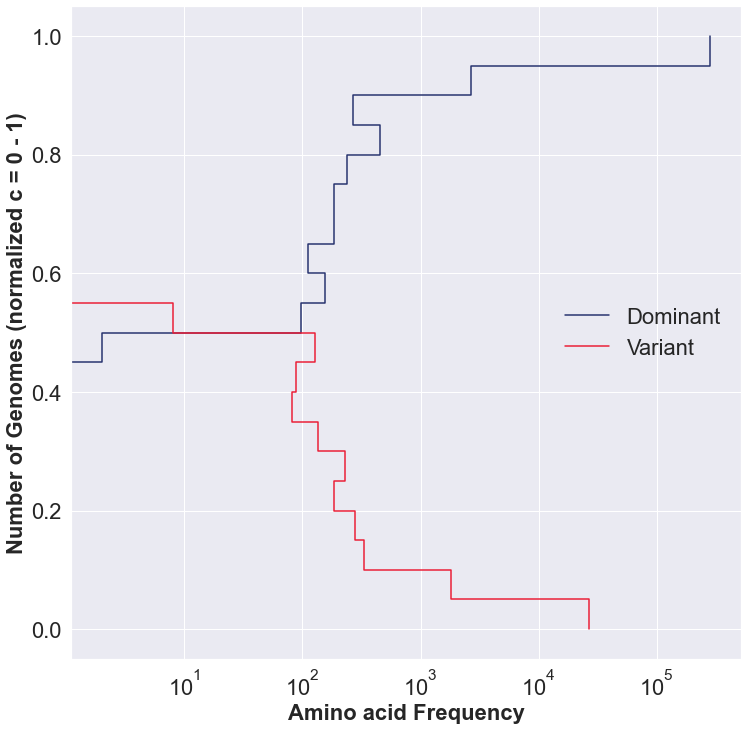

In [19]:
import seaborn as sns
df=pd.read_csv('final_pan_aa_thresh_core_genes_dom_var_genome_count_pos_normalized.csv')

fig, ax = plt.subplots(figsize=(12,12))

g=sns.histplot(df, y="Genome_count_norm", hue="Sequence_type", element="step",log_scale=(True,False),fill=False, palette=['#EB1D36','#25316D'])
#EB455F,'#3C6255','#85586F'
#sns.move_legend(g, "center right")
plt.legend(title='',loc='center right', labels=['Dominant', 'Variant'], frameon=False)
plt.setp(g.get_legend().get_texts(), fontsize='22') 
plt.setp(g.get_legend().get_title(), fontsize='22') 

plt.xlabel('Amino acid Frequency', fontsize=22, weight='bold')
plt.ylabel('Number of Genomes (normalized c = 0 - 1)', fontsize=22,weight='bold')
#plt.title('Alleleome for all ORFs',fontsize=14)
#g.fig.get_axes()[0].invert_xaxis()




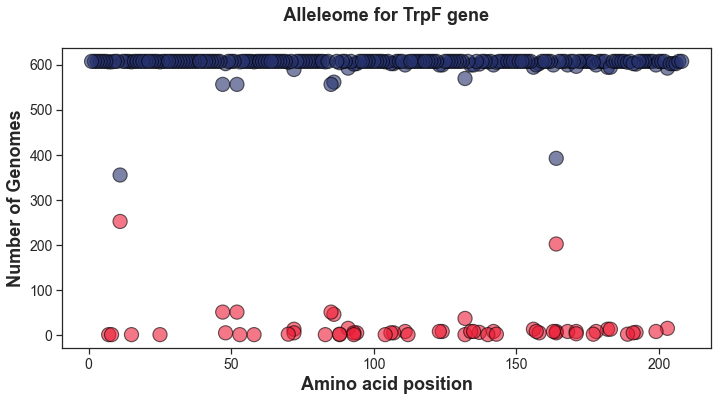

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import markers
# get all possible shapes

#old file####df_clpB=pd.read_csv('clpB_dom_var_pos.csv')
df=pd.read_csv('trpF_pan_aa_thresh_core_dom_var_pos.csv')

sns.set(style="white")  
plt.rcParams["figure.figsize"] = (18,7)

#rc = {'figure.figsize':(12,5),
 #     'axes.facecolor':'white',
  #    'font.family':'Times New Roman',
   #  }
#plt.rcParams.update(rc)

sns.set(style="ticks")


g=sns.relplot(x="AA_pos", y="Genome_count", hue="Sequence_type", size="Genome_count", 
    palette=['#EB1D36','#25316D'],sizes=(200,200),edgecolor='black', height=5, aspect=2,data=df,alpha=0.6)
#plt.setp(g._legend.get_texts(), fontsize=20,  weight='bold')

g.legend.remove()

#g.fig.legend(handles=g.legend.legendHandles[1:3], loc=7, bbox_to_anchor=(.85, .55),fontsize=16,frameon=False,)

#["#E9F6FA", "#003f5c"]658864,B7B78A '#EB1D36','#25316D','#00A8CC','#F7EC09','#25316D','#F0A04B','#183A1D','#EB1D36','#25316D'
sns.despine(top = False, right = False)
#ax.legend().set_title('')


#marker='s' gives square shape
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#plt.legend(bbox_to_anchor=(1.05,1), loc='center', borderaxespad=0)
#plt.legend(loc='center right', title='Team')
#plt.legend(bbox_to_anchor=(1.02, 0.15), loc='upper left', borderaxespad=0)
plt.xlabel('Amino acid position', fontsize=18,weight='bold')
plt.ylabel('Number of Genomes', fontsize=18,weight='bold')
plt.title(' Alleleome for TrpF gene \n', fontsize=18, weight='bold')
#path="/Users/arcsan/Documents/allele_from_pan_genome_data_analysis/alleleome/analysis/dom_var/new/"
#plt.legend(bbox_to_anchor=(0.5, -0.2), loc='lower center', ncol=5, fontsize=18, frameon=False)

# change color

#plt.savefig('/Users/arcsan/Documents/allele_from_pan_genome_data_analysis/alleleome/analysis/dom_var/correct_dom_vars/Lplanta_gene_group_12396_final_dom_var_aa_pos.png', bbox_inches='tight', edgecolor='auto' )
plt.savefig('Lplanta_gene_trpF_thresh_dom_var_aa_pos.png', bbox_inches='tight', edgecolor='auto' )

plt.show()


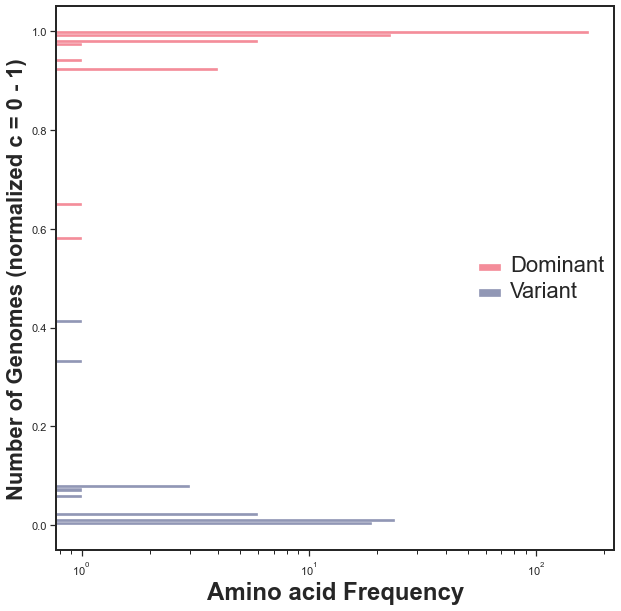

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
fig, ax = plt.subplots(figsize=(10,10))
data1=pd.read_csv('trpF_thresh_normalized_dom_var.csv')

g=sns.histplot(data1, y="Genome_count_norm", hue="Sequence_type",log_scale=(True,False), palette=['#25316D','#EB1D36'])
#EB455F,'#3C6255','#85586F'
sns.move_legend(g, "center right")
plt.legend(title='',loc='center right', labels=['Dominant', 'Variant'], frameon=False)
plt.setp(g.get_legend().get_texts(), fontsize='22') 
plt.setp(g.get_legend().get_title(), fontsize='22') 

plt.xlabel('Amino acid Frequency', fontsize=24,weight='bold')
plt.ylabel('Number of Genomes (normalized c = 0 - 1)', fontsize=22,weight='bold')
#plt.title('Alleleome for an ORF',fontsize=24,weight='bold')
#g.fig.get_axes()[0].invert_xaxis()
#sns.despine(top = False, right = False)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(2)


/var/folders/k8/hfnxgs3n2sdfd9jnywj75spr0000gp/T/ipykernel_72618/423314640.py:9: DtypeWarning: Columns (20,21) have mixed types. Specify dtype option on import or set low_memory=False.
  df1=pd.read_csv('core_pan_aa_thresh_vars_with_phylogroups_and_COG_category.csv', index_col=0)


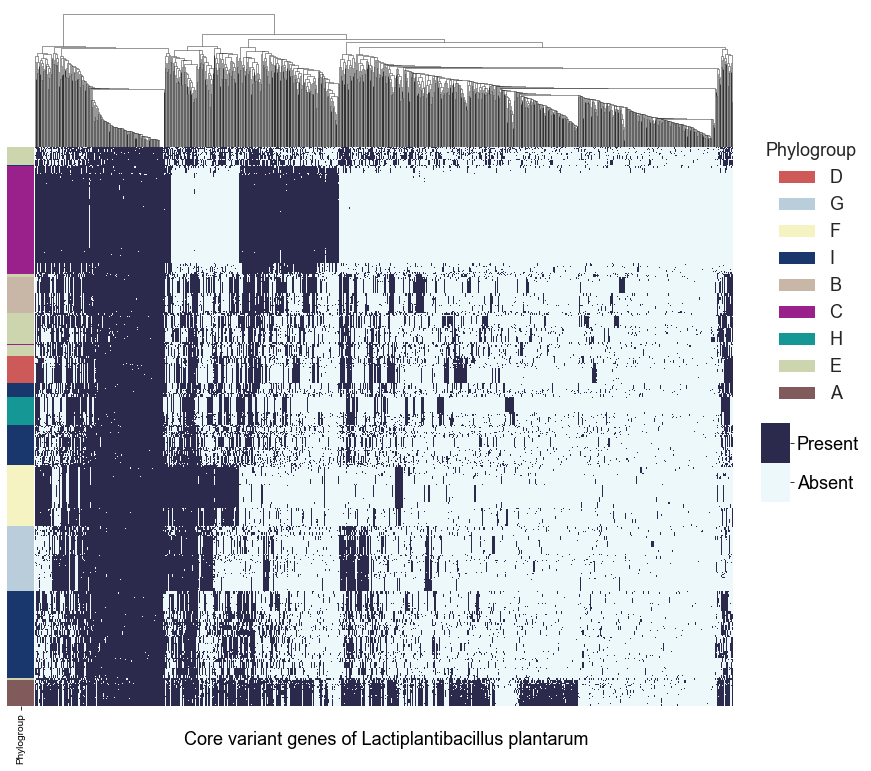

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import gcf
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap


df1=pd.read_csv('core_pan_aa_thresh_vars_with_phylogroups_and_COG_category.csv', index_col=0)

df2=df1[['GCF_id','cluster','Gene','Query_locus_tag']]
df2
table =  df2.pivot_table(index=['GCF_id','cluster'], columns='Gene',
                           aggfunc='any', fill_value=0).astype(int)
table
t=table.reset_index()
stn = t.pop("GCF_id")

phy=t.pop("cluster")
#print(phy)





sp_pal=['#CE5959','#BACDDB','#F5F3C1','#19376D','#C8B6A6','#9A208C','#159895','#CCD5AE','#815B5B']


#print(sp_pal)
phy_lut = dict(zip(map(str, phy.unique()), sp_pal))
#print(phy_lut)

phy_colors = pd.Series(phy).map(phy_lut)
#print(phy_colors)
row_colors = pd.DataFrame({'Phylogroup':phy_colors})

#print(row_colors)
from matplotlib.colors import ListedColormap
#plt.figure(figsize=(20, 50))


# Place legend outside of the main plot
cmap = ListedColormap(['#ECF8F9','#2B2A4C'])

g=sns.clustermap(t,row_colors=row_colors,yticklabels=False,xticklabels=False, cmap=cmap)
#g=sns.clustermap(t,row_colors=row_colors,yticklabels=False,xticklabels=False, cmap=cmap,cbar_kws={"ticks":[0,1]})
sns.set(font_scale=1.5) # font size 2

g.fig.set_size_inches((13,11))



g.ax_row_dendrogram.set_visible(False)


# Color bar
for label in phy.unique():
    g.ax_col_dendrogram.bar(0, 0, color=phy_lut[label],
                            label=label, linewidth=0)
g.ax_col_dendrogram.legend(title='Phylogroup',loc="right", ncol=1,bbox_to_anchor=(1.20, -0.9),frameon=False,fontsize=18)

# Adjust the postion of the main colorbar for the heatmap
#g.cax.position = [0.2, .1, .75]

###

ax = g.ax_heatmap
#ax.set_ylabel('\n Phylogroups of Lactiplantibacillus plantarum\n', fontsize=18)
ax.set_xlabel('\n Core variant genes of Lactiplantibacillus plantarum', fontsize=18)
colorbar = ax.collections[0].colorbar
colorbar.set_ticks([0.25,0.75])
colorbar.set_ticklabels(['Absent', 'Present'])
colorbar.ax.tick_params(labelsize=18)
g.ax_cbar.set_position((1.015, .36, .03, .1))

###

#g.ax_cbar.set_position([-0.128, 0.73, g.ax_row_dendrogram.get_position().width, 0.05])
#g.ax_cbar.set_title('colorbar title')
#g.ax_cbar.tick_params(axis='x', length=2,va='center')
#for spine in g.ax_cbar.spines:
 #   g.ax_cbar.spines[spine].set_color('grey')
  #  g.ax_cbar.spines[spine].set_linewidth(0.5)
plt.show()

